<a href="https://colab.research.google.com/github/hrumst/ML/blob/NS-gclb-2/gclb2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%config IPComplater.greedy = True

In [4]:
from google.colab import drive
drive.mount('./DRIVE', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at ./DRIVE
Mounted at ./DRIVE


In [0]:
!rm -rf sample_data

In [0]:
!rm -rf inputs/plates

In [7]:
import shutil, os
shutil.copytree('./DRIVE/My Drive/Colab Notebooks/input/plates', 'inputs/plates')

'inputs/plates'

In [0]:
import cv2
def crop_image(img_path, dest_path):
    path, file = os.path.split(img_path)
    if not file.endswith('.jpg'):
        return
    
    img = cv2.imread(img_path)
    img_m = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_m = cv2.medianBlur(img_m, 5)

    circles = None
    dp = .1
    while dp < 10:
        circles = cv2.HoughCircles(img_m, cv2.HOUGH_GRADIENT, dp, 50)
        dp += .1
        if circles is not None and len(circles) >=3:
            break
    if circles is None:
        cv2.imwrite(dest_path, img)
        return 
      
    img_center = (round(img.shape[0]/2), round(img.shape[1]/2))
    img_center_tol = (round(img_center[0]/3), round(img_center[1]/3))
    img_med_size = round((img.shape[0] + img.shape[1])/6)
    circle_candidates = []
    for circle in circles[0]:
        if abs(circle[0] - img_center[0]) > img_center_tol[0] or abs(circle[1] - img_center[1]) > img_center_tol[1]:
            continue
        if circle[2] < img_med_size:
            continue
        circle_candidates.append(circle)
    
    if len(circle_candidates) > 2:
        max_circle = circle_candidates[0]
        for circle in circle_candidates[1:]:
            if circle[2] > max_circle[2]:
                max_circle = circle
        main_circle = max_circle
    elif len(circle_candidates) == 1:
        main_circle = circle_candidates[0]
    else:
        main_circle =  circles[0][0]

    if main_circle[0] + main_circle[2] > img.shape[0] or main_circle[1] + main_circle[2] > img.shape[1]:
        cv2.imwrite(dest_path, img)
        return 
    main_circle = np.uint16(np.around(main_circle))
    
    mask = np.zeros((img.shape[0],img.shape[1],3), np.uint8)
    cv2.circle(mask,(main_circle[0], main_circle[1]),main_circle[2],(1,1,1),-1,8,0)
    out = np.uint16(img)*np.uint16(mask)
    crop_center = main_circle[2] if main_circle[2] >= 112 else 112
    out = out[
          abs(np.int8(main_circle[1])-np.int8(crop_center)):main_circle[1]+crop_center, 
          abs(np.int8(main_circle[0])-np.int8(crop_center)):main_circle[0]+crop_center,
    ]
    
    cv2.imwrite(dest_path, out)

In [9]:
!rm -rf val && rm -rf train

#%%
import pandas as pd
import os
import torch, torch.nn
import numpy as np
import torchvision
import matplotlib.pyplot as plt
import time
import copy
from torch import nn
from torchvision import transforms, models

data_root = 'inputs/plates/plates/'
#%%

import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val' # validation

class_names = ['cleaned', 'dirty']

# удобное копирование картинок по папкам
for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

for class_name in class_names:
    source_dir = os.path.join(data_root, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        # if i % 100 != 0:
        dest_dir = os.path.join(train_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))
        # else:
            # dest_dir = os.path.join(val_dir, class_name)
            # shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

for class_name in class_names:
    source_dir = os.path.join(data_root, 'ext-test', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        dest_dir = os.path.join(val_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

100%|██████████| 25/25 [00:00<00:00, 3439.87it/s]


In [0]:

batch_size = 8

train_transforms = transforms.Compose([
    # аугментация
#     transforms.RandomResizedCrop(224),
    transforms.RandomRotation(30),
    transforms.CenterCrop(224),
    transforms.ColorJitter(brightness=0.8, contrast=0.8, saturation=0.8),
    transforms.RandomHorizontalFlip(),
    # transforms.RandomVerticalFlip(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(train_dir, train_transforms)
val_dataset = torchvision.datasets.ImageFolder(val_dir, val_transforms)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


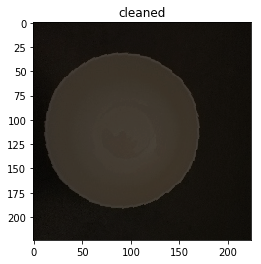

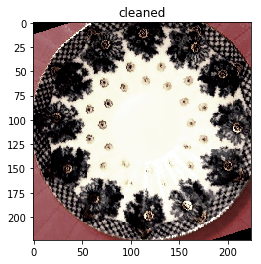

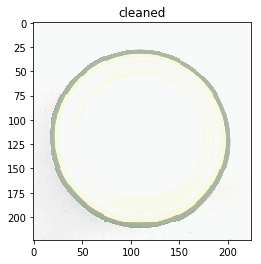

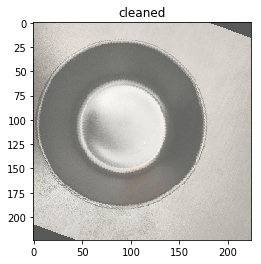

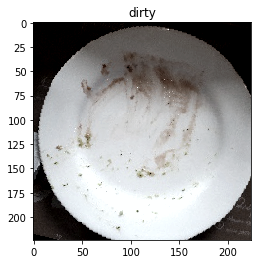

...

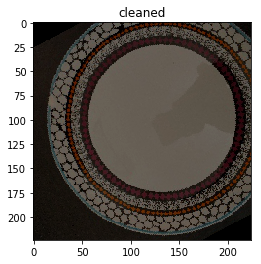

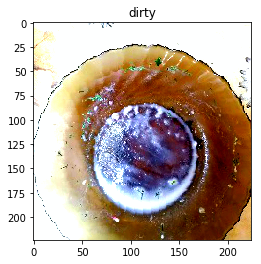

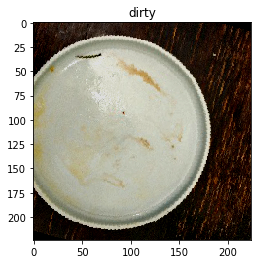

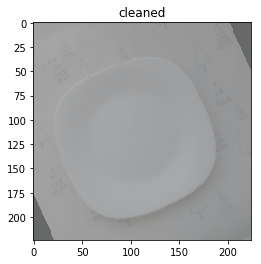

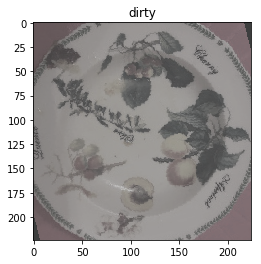

In [11]:
#%%

batch_size = 20
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)

X_batch, y_batch = next(iter(train_dataloader))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
# денормализация векторов для печати
plt.imshow(X_batch[0].permute(1, 2, 0).numpy() * std + mean);

#%%

def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

X_batch, y_batch = next(iter(train_dataloader))

for x_item, y_item in zip(X_batch, y_batch):
    show_input(x_item, title=class_names[y_item])

In [0]:
def make_resnext101_32x8d():
    model = models.resnext101_32x8d(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )

    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

In [0]:
# pretrained=True сеть уже пред-тренерована на гугловом имадже-нете
def make_resnet152():
    model = models.resnet152(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )
    
    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
                
        elif name == 'layer3':
            for chName, chChild in child.named_children():
                if name not in muted:
                    muted[name] = 0
                if int(chName) not in [32, 33, 34, 35]:
                    for (i,param) in enumerate(chChild.parameters()):
                        param.requires_grad = False         
                        muted[name] += 1
                else:
                    if name not in passed:
                        passed[name] = 0
                    for (i,param) in enumerate(chChild.parameters()):       
                        passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

In [70]:
t1 = torch.tensor([1,2,3,4])
t2 = torch.tensor([1,2,5,4])
for (i, el) in enumerate(t1):
    print(el, t2[i])

cmp = (t1 == t2)
for (i, el) in enumerate(cmp):
    if el == 1:
        print(el)

print(cmp.float().mean())

tensor(1) tensor(1)
tensor(2) tensor(2)
tensor(3) tensor(5)
tensor(4) tensor(4)
tensor(1, dtype=torch.uint8)
tensor(1, dtype=torch.uint8)
tensor(1, dtype=torch.uint8)
tensor(0.7500)


In [0]:
class EpochModel():
    def __init__(self, train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device):
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.model = model
        self.loss = loss
        self.optimizer = optimizer
        self.scheduler = scheduler
        
        self.device = device
        
        self.train_ac_history = []
        self.val_ac_history = []
        self.fail_cmp_stats = {}
        
    def train(self, num_epochs, train_phases=None):
        if train_phases is None:
            train_phases = [self._epoch_train, self._epoch_validate]
        for epoch in range(num_epochs):
            print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)
            # Each epoch has a training and validation phase
            for phase in train_phases:
                phase()
        return model

    def _print_log(self, phase, epoch_loss, epoch_acc):
        print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)
    
    def _epoch_validate(self):
        self.model.eval()

        running_loss = 0.
        running_acc = 0.
        running_acc_m = 0.

        i_acc = 0
        for inputs, labels in tqdm(self.val_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(False):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)

            running_loss += loss_value.item()
            running_acc = (preds_class == labels.data)
            running_acc_m += running_acc.float().mean()

            for run_acc_item in running_acc:
                if run_acc_item == 0:
                    if i_acc not in self.fail_cmp_stats:
                        self.fail_cmp_stats[i_acc] = 1
                    else:
                        self.fail_cmp_stats[i_acc] += 1
                i_acc += 1
        
        epoch_loss = running_loss / len(self.val_dataloader)
        epoch_acc = running_acc_m / len(self.val_dataloader)
        self._print_log('validate', epoch_loss, epoch_acc)
        self.val_ac_history.append(epoch_acc.item())

    def _epoch_train(self):
        self.model.train()

        running_loss = 0.
        running_acc = 0.

        for inputs, labels in tqdm(self.train_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(True):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)
                # train work
                loss_value.backward()
                self.optimizer.step()

            running_loss += loss_value.item()
            running_acc += (preds_class == labels.data).float().mean()

        epoch_loss = running_loss / len(self.train_dataloader)
        epoch_acc = running_acc / len(self.train_dataloader)

        # train work
        self.scheduler.step(epoch_loss)

        self._print_log('train', epoch_loss, epoch_acc)
        self.train_ac_history.append(epoch_acc.item())

In [79]:
batch_size = 8

train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)
            

tme_history = []
for i in range(0,10):
    torch.backends.cudnn.deterministic = True
    torch.cuda.manual_seed(i)
    np.random.seed(i)
    torch.manual_seed(i)

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = make_resnet152().to(device)

    for _ in [1]:
        loss = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adamax(model.parameters(), lr=.005)

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, verbose=True)

        tme = EpochModel(train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device)
        tme_history.append(tme)
        tme.train(200)
    


{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.14it/s]





 40%|████      | 2/5 [00:01<00:02,  1.42it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.09it/s]





100%|██████████| 5/5 [00:01<00:00,  2.43it/s]







train Loss: 0.9091 Acc: 0.4750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 85975.8359 Acc: 0.5833
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.5195 Acc: 0.6500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 940.6799 Acc: 0.5833
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.5509 Acc: 0.7250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 1.3152 Acc: 0.5833
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.4533 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.6021 Acc: 0.7417
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.74it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.3145 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.5897 Acc: 0.5833
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.4909 Acc: 0.8250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.51it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.2617 Acc: 0.8500
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.2001 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3428 Acc: 0.8375
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1784 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3811 Acc: 0.8333
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1514 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3804 Acc: 0.9250
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.56it/s]







train Loss: 0.1204 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.5535 Acc: 0.7000
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2191 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.5230 Acc: 0.6792
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1373 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3884 Acc: 0.7833
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.43it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0902 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3420 Acc: 0.7833
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0975 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2071 Acc: 0.9250
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.3158 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1967 Acc: 0.8833
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0964 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.2317 Acc: 0.8750
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0393 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.5201 Acc: 0.7292
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.1355 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.6389 Acc: 0.7292
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0311 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.6691 Acc: 0.7083
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0783 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.4665 Acc: 0.7292
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1531 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2370 Acc: 0.9167
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1110 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.2516 Acc: 0.9042
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1171 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.2993 Acc: 0.8750
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.2132 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2510 Acc: 0.8750
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0409 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1916 Acc: 0.8958
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0549 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1837 Acc: 0.8833
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1738 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.1622 Acc: 0.9375
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2627 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2036 Acc: 0.9042
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0485 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2072 Acc: 0.8833
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







Epoch    29: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0371 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.3176 Acc: 0.8542
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0526 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3007 Acc: 0.8542
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0402 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.3298 Acc: 0.8125
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0609 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.27it/s]







validate Loss: 0.3171 Acc: 0.8125
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0524 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3306 Acc: 0.8125
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0888 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3255 Acc: 0.8125
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2452 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.4170 Acc: 0.7708
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.53it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.88it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0474 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3956 Acc: 0.7708
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1956 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.50it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.01it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.53it/s]





100%|██████████| 6/6 [00:01<00:00,  4.23it/s]







validate Loss: 0.3775 Acc: 0.7708
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0817 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3082 Acc: 0.8125
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0264 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2918 Acc: 0.8333
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0130 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2995 Acc: 0.8333
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1569 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3532 Acc: 0.7917
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1198 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3192 Acc: 0.8125
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:00<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.5633 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.2940 Acc: 0.8542
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0408 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3762 Acc: 0.7708
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0324 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3236 Acc: 0.8125
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0739 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3657 Acc: 0.7917
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0886 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.4070 Acc: 0.7500
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0431 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3334 Acc: 0.8125
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0269 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3222 Acc: 0.8125
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1404 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3340 Acc: 0.8125
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







Epoch    51: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0465 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3099 Acc: 0.8333
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1025 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2685 Acc: 0.8542
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0663 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.17it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.67it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.38it/s]







validate Loss: 0.2549 Acc: 0.8542
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0166 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2737 Acc: 0.8542
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2352 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2730 Acc: 0.8542
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0372 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2963 Acc: 0.8333
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0231 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2804 Acc: 0.8542
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0440 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.73it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.17it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.67it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.19it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.38it/s]







validate Loss: 0.2858 Acc: 0.8542
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.53it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0321 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2906 Acc: 0.8542
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0135 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.2810 Acc: 0.8542
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0332 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2805 Acc: 0.8333
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







Epoch    62: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0529 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.3231 Acc: 0.8125
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2576 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3030 Acc: 0.8125
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1332 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.2866 Acc: 0.8333
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0489 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3066 Acc: 0.8333
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0984 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2927 Acc: 0.8333
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:00<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0318 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3008 Acc: 0.8542
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.54it/s]





 40%|████      | 2/5 [00:00<00:01,  1.88it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.24it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.56it/s]





100%|██████████| 5/5 [00:01<00:00,  2.87it/s]







train Loss: 0.0550 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3024 Acc: 0.8333
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0244 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3175 Acc: 0.8125
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1145 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.3335 Acc: 0.8125
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0292 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3051 Acc: 0.8333
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.53it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.56it/s]







train Loss: 0.2852 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.82it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.43it/s]







validate Loss: 0.2763 Acc: 0.8542
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







Epoch    73: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0270 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2685 Acc: 0.8542
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0198 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.11it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.2988 Acc: 0.8333
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1176 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3269 Acc: 0.8125
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0796 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3097 Acc: 0.8333
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0480 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3201 Acc: 0.8125
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0207 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2881 Acc: 0.8333
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0196 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3181 Acc: 0.8333
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0279 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3263 Acc: 0.8333
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0496 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.26it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.76it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.48it/s]







validate Loss: 0.3032 Acc: 0.8333
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0621 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2974 Acc: 0.8333
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2708 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.3273 Acc: 0.8333
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







Epoch    84: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0255 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3010 Acc: 0.8333
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0537 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2923 Acc: 0.8333
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1037 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3016 Acc: 0.8333
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0314 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2784 Acc: 0.8542
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0422 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.3055 Acc: 0.8333
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0784 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3229 Acc: 0.8333
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0266 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3238 Acc: 0.8333
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1282 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.03it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.52it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.55it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.3128 Acc: 0.7917
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0638 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.2987 Acc: 0.8333
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.46it/s]





 40%|████      | 2/5 [00:00<00:01,  1.79it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.14it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.49it/s]





100%|██████████| 5/5 [00:01<00:00,  2.80it/s]







train Loss: 0.0281 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.3296 Acc: 0.7917
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1058 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3360 Acc: 0.8125
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







Epoch    95: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0294 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3247 Acc: 0.8125
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1122 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.3347 Acc: 0.8125
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0279 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3554 Acc: 0.7708
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0388 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3073 Acc: 0.8333
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1123 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.3305 Acc: 0.8333
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0509 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3307 Acc: 0.8125
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0208 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3211 Acc: 0.8125
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0976 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.3395 Acc: 0.7917
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0474 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3506 Acc: 0.8125
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0390 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.3248 Acc: 0.8125
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0214 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3255 Acc: 0.8125
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0944 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3139 Acc: 0.8333
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1365 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2991 Acc: 0.8333
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.1669 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2439 Acc: 0.8542
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0154 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2612 Acc: 0.8542
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0438 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2849 Acc: 0.8333
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0330 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2999 Acc: 0.8333
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.26it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.59it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.0335 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3180 Acc: 0.8333
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0592 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.3119 Acc: 0.8333
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0599 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.3405 Acc: 0.8125
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0984 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3258 Acc: 0.8125
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.5581 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3388 Acc: 0.8125
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1336 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3041 Acc: 0.8333
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0460 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2941 Acc: 0.8333
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0801 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3013 Acc: 0.8333
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0371 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3165 Acc: 0.8333
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0448 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.83it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.2959 Acc: 0.8333
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0415 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2870 Acc: 0.8542
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0937 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2901 Acc: 0.8542
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0291 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.13it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.64it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.16it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.65it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.3116 Acc: 0.8333
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0597 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3223 Acc: 0.8333
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0151 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.2952 Acc: 0.8333
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0395 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2920 Acc: 0.8542
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0456 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2776 Acc: 0.8542
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0196 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2898 Acc: 0.8333
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0405 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.2996 Acc: 0.8333
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.62it/s]





100%|██████████| 5/5 [00:01<00:00,  2.93it/s]







train Loss: 0.0238 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3174 Acc: 0.8333
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0336 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3150 Acc: 0.8333
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0219 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2942 Acc: 0.8333
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0632 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2540 Acc: 0.8542
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0996 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.2649 Acc: 0.8542
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0274 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3020 Acc: 0.8333
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1587 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3079 Acc: 0.8333
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0143 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3243 Acc: 0.8125
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0432 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3127 Acc: 0.8125
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1644 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2520 Acc: 0.8542
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0127 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2972 Acc: 0.8333
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0516 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3457 Acc: 0.7917
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.94it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.29it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.93it/s]







train Loss: 0.0946 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.77it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.29it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]





100%|██████████| 6/6 [00:01<00:00,  4.46it/s]







validate Loss: 0.3153 Acc: 0.8125
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0238 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3022 Acc: 0.8542
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1836 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2766 Acc: 0.8542
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.1102 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2762 Acc: 0.8333
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0218 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2737 Acc: 0.8542
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0861 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3253 Acc: 0.8333
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0517 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3291 Acc: 0.8125
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0247 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3413 Acc: 0.8125
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0750 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3384 Acc: 0.8125
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0690 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.3185 Acc: 0.8333
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0194 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.68it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.3269 Acc: 0.7917
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0321 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.3310 Acc: 0.8125
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0283 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2792 Acc: 0.8542
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0337 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2718 Acc: 0.8542
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1223 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2763 Acc: 0.8542
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0189 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2860 Acc: 0.8333
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1940 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.71it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.23it/s]





100%|██████████| 6/6 [00:01<00:00,  3.91it/s]







validate Loss: 0.2640 Acc: 0.8542
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.53it/s]





 40%|████      | 2/5 [00:00<00:01,  1.87it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.23it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.56it/s]





100%|██████████| 5/5 [00:01<00:00,  2.87it/s]







train Loss: 0.0526 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.2646 Acc: 0.8542
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.1797 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3010 Acc: 0.8333
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0343 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3010 Acc: 0.8333
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1471 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3417 Acc: 0.8125
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0340 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3317 Acc: 0.8333
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0285 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.92it/s]







validate Loss: 0.3520 Acc: 0.8125
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0336 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.3181 Acc: 0.8125
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0365 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3362 Acc: 0.8125
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0399 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3704 Acc: 0.7708
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1795 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.3413 Acc: 0.7917
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0393 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.3353 Acc: 0.7917
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0857 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2926 Acc: 0.8333
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0366 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.2941 Acc: 0.8333
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.58it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.4910 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2627 Acc: 0.8542
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0544 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2739 Acc: 0.8542
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0148 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3064 Acc: 0.8333
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1958 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3095 Acc: 0.8333
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0398 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.89it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.79it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.31it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.81it/s]





100%|██████████| 6/6 [00:01<00:00,  4.52it/s]







validate Loss: 0.3031 Acc: 0.8333
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0310 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2993 Acc: 0.8333
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0179 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3206 Acc: 0.8333
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0478 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.73it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.3083 Acc: 0.8333
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0968 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3612 Acc: 0.7917
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0375 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3453 Acc: 0.7917
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0445 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3405 Acc: 0.8125
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0526 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.55it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.3253 Acc: 0.7917
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.4615 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.11it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.3273 Acc: 0.8125
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0197 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3038 Acc: 0.8333
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0522 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2794 Acc: 0.8542
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0645 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3240 Acc: 0.8125
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0596 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3214 Acc: 0.8125
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0247 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2779 Acc: 0.8542
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0550 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.21it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.72it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.24it/s]





100%|██████████| 6/6 [00:01<00:00,  3.93it/s]







validate Loss: 0.3035 Acc: 0.8333
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1795 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3333 Acc: 0.8125
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2434 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3277 Acc: 0.8125
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0680 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3430 Acc: 0.8125
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0175 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3278 Acc: 0.8125
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0757 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3076 Acc: 0.8333
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2923 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3359 Acc: 0.8125
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0690 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3287 Acc: 0.8125
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0251 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.3206 Acc: 0.8125
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.04it/s]





 40%|████      | 2/5 [00:01<00:02,  1.32it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]





 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]





100%|██████████| 5/5 [00:02<00:00,  2.32it/s]







train Loss: 1.2091 Acc: 0.3750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.76it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.19it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.68it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.36it/s]







validate Loss: 9024.9069 Acc: 0.4167
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.7374 Acc: 0.6250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 237.0324 Acc: 0.4167
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.5278 Acc: 0.7750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 2.9866 Acc: 0.4167
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.5536 Acc: 0.7500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.52it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.54it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 1.5868 Acc: 0.5208
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.4604 Acc: 0.7750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.9330 Acc: 0.6583
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.3749 Acc: 0.8250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 1.0394 Acc: 0.5958
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.3062 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.6836 Acc: 0.7208
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.3220 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.5779 Acc: 0.7417
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.2478 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.5328 Acc: 0.7417
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1455 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3713 Acc: 0.8083
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.3112 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.4070 Acc: 0.7625
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.2428 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4186 Acc: 0.7542
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2621 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.2307 Acc: 0.9375
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.2536 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2917 Acc: 0.8833
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2410 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3620 Acc: 0.8500
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.2467 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3041 Acc: 0.8625
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0828 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.2881 Acc: 0.9167
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0610 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2810 Acc: 0.9167
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1430 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2619 Acc: 0.9375
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.3265 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.2525 Acc: 0.9167
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1892 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2605 Acc: 0.9167
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1401 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.2611 Acc: 0.9167
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0933 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2685 Acc: 0.8833
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0807 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.2919 Acc: 0.8708
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1090 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.3527 Acc: 0.8083
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0641 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3615 Acc: 0.8292
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0368 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3516 Acc: 0.8292
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0974 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.2637 Acc: 0.9167
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0684 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.2721 Acc: 0.9167
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0760 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2492 Acc: 0.8958
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1811 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2612 Acc: 0.8958
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.1545 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.2595 Acc: 0.9167
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.3193 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.4010 Acc: 0.8958
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0609 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3744 Acc: 0.8958
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0284 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.71it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.23it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.42it/s]







validate Loss: 0.2963 Acc: 0.9167
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0869 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.89it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.29it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.30it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.81it/s]





100%|██████████| 6/6 [00:01<00:00,  4.51it/s]







validate Loss: 0.2781 Acc: 0.8958
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2082 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.2739 Acc: 0.8625
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0267 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2622 Acc: 0.9167
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.2243 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.4281 Acc: 0.8333
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1194 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3717 Acc: 0.8542
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.52it/s]





 40%|████      | 2/5 [00:00<00:01,  1.86it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.20it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.53it/s]





100%|██████████| 5/5 [00:01<00:00,  2.84it/s]







train Loss: 0.1067 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:02,  2.00it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.49it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.02it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.54it/s]





100%|██████████| 6/6 [00:01<00:00,  4.24it/s]







validate Loss: 0.1688 Acc: 0.9583
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0453 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1473 Acc: 0.9583
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0589 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1464 Acc: 0.9583
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.52it/s]





 40%|████      | 2/5 [00:00<00:01,  1.85it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.21it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.56it/s]





100%|██████████| 5/5 [00:01<00:00,  2.87it/s]







train Loss: 0.1187 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1689 Acc: 0.9375
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.56it/s]





 40%|████      | 2/5 [00:00<00:01,  1.90it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.25it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.58it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.0575 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.2022 Acc: 0.9375
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0807 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2789 Acc: 0.8500
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0686 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.3083 Acc: 0.8500
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0356 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2446 Acc: 0.9042
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0174 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2335 Acc: 0.9167
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1785 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2721 Acc: 0.9167
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.3046 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.2824 Acc: 0.9167
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0320 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2995 Acc: 0.8958
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1025 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3171 Acc: 0.8750
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1708 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.75it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.18it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.69it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.21it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.71it/s]





100%|██████████| 6/6 [00:01<00:00,  4.41it/s]







validate Loss: 0.2564 Acc: 0.8750
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1564 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:02,  2.00it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.49it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.00it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1936 Acc: 0.9375
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1695 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1887 Acc: 0.9375
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2062 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1759 Acc: 0.9375
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.94it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.93it/s]







train Loss: 0.1422 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1547 Acc: 0.9792
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0490 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.1465 Acc: 0.9792
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







Epoch    59: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0426 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1713 Acc: 0.9583
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0401 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1795 Acc: 0.9583
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0596 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1765 Acc: 0.9583
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0936 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.2000 Acc: 0.9167
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1588 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1972 Acc: 0.9375
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0431 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.80it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.18it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.70it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.22it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.71it/s]





100%|██████████| 6/6 [00:01<00:00,  4.40it/s]







validate Loss: 0.1823 Acc: 0.9375
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0309 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1975 Acc: 0.9583
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0330 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.57it/s]





100%|██████████| 6/6 [00:01<00:00,  4.27it/s]







validate Loss: 0.1707 Acc: 0.9583
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0487 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.1896 Acc: 0.9583
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0785 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.77it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.20it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.70it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.21it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.39it/s]







validate Loss: 0.2085 Acc: 0.9167
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0288 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1892 Acc: 0.9583
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







Epoch    70: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0484 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1891 Acc: 0.9583
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0528 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1882 Acc: 0.9583
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0909 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.1755 Acc: 0.9583
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0418 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1833 Acc: 0.9583
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.94it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.29it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0279 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.2044 Acc: 0.9583
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0327 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1788 Acc: 0.9583
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0759 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.1941 Acc: 0.9583
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0960 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1820 Acc: 0.9583
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0292 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1965 Acc: 0.9375
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0262 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1901 Acc: 0.9583
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0840 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.23it/s]







validate Loss: 0.1797 Acc: 0.9583
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







Epoch    81: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.4979 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1881 Acc: 0.9583
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1112 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2017 Acc: 0.9583
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0986 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2056 Acc: 0.9375
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0203 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2209 Acc: 0.9375
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0691 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2267 Acc: 0.9167
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0270 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2036 Acc: 0.9375
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0523 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1959 Acc: 0.9375
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0508 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.2024 Acc: 0.9167
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2118 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1930 Acc: 0.9375
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0132 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2145 Acc: 0.9167
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0511 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.2090 Acc: 0.9167
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1165 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1946 Acc: 0.9375
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0501 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.2044 Acc: 0.9375
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0144 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1974 Acc: 0.9375
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0417 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.2100 Acc: 0.9167
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0338 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1994 Acc: 0.9375
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1089 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2125 Acc: 0.9167
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0353 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.2232 Acc: 0.9167
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0966 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2232 Acc: 0.9167
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0236 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2008 Acc: 0.9583
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:01<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







Epoch   101: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0322 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.51it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.02it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.2145 Acc: 0.9167
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0325 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2356 Acc: 0.9167
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1287 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1994 Acc: 0.9375
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.18it/s]





 40%|████      | 2/5 [00:01<00:02,  1.49it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.19it/s]





100%|██████████| 5/5 [00:01<00:00,  2.54it/s]







train Loss: 0.0144 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1830 Acc: 0.9583
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0129 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1857 Acc: 0.9583
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0336 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1924 Acc: 0.9583
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1446 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.2029 Acc: 0.9583
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0234 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2259 Acc: 0.9375
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0771 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2413 Acc: 0.9167
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.1915 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.2173 Acc: 0.9167
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1800 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2158 Acc: 0.9167
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0218 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.2120 Acc: 0.9375
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0268 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1906 Acc: 0.9375
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0384 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1849 Acc: 0.9583
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0967 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1716 Acc: 0.9583
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







Epoch   116: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0737 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1673 Acc: 0.9583
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1897 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1785 Acc: 0.9583
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1448 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1817 Acc: 0.9583
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0381 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1853 Acc: 0.9583
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1165 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1901 Acc: 0.9375
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0186 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.76it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.18it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.69it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.20it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.38it/s]







validate Loss: 0.1885 Acc: 0.9583
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0421 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.24it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.48it/s]







validate Loss: 0.2059 Acc: 0.9167
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0330 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2018 Acc: 0.9167
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0263 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1975 Acc: 0.9375
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0255 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1869 Acc: 0.9583
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0303 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1894 Acc: 0.9583
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







Epoch   127: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0139 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.11it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.1817 Acc: 0.9583
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2124 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1957 Acc: 0.9375
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0130 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.74it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.1894 Acc: 0.9583
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0490 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1953 Acc: 0.9583
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1198 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.2018 Acc: 0.9583
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0577 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1742 Acc: 0.9583
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0293 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1860 Acc: 0.9583
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0908 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1836 Acc: 0.9583
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0230 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1801 Acc: 0.9583
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0414 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1867 Acc: 0.9375
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0289 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.87it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.77it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.46it/s]







validate Loss: 0.1800 Acc: 0.9583
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.4339 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.1947 Acc: 0.9583
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.92it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.90it/s]







train Loss: 0.0916 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2012 Acc: 0.9583
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.88it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.1303 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2070 Acc: 0.9583
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2279 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.2325 Acc: 0.9167
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.5079 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2241 Acc: 0.9167
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0333 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1917 Acc: 0.9583
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1892 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1852 Acc: 0.9583
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0511 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1881 Acc: 0.9583
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0423 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.84it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.43it/s]







validate Loss: 0.2004 Acc: 0.9167
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0542 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2087 Acc: 0.9375
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1183 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.1901 Acc: 0.9375
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1946 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2036 Acc: 0.9375
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0899 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1966 Acc: 0.9375
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0181 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.06it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.57it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.1940 Acc: 0.9583
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0373 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1814 Acc: 0.9583
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0393 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1806 Acc: 0.9583
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.2077 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1773 Acc: 0.9583
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0321 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1862 Acc: 0.9583
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0446 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1926 Acc: 0.9583
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.92it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.90it/s]







train Loss: 0.0216 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1955 Acc: 0.9583
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0973 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2011 Acc: 0.9375
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0308 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2039 Acc: 0.9167
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0190 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2005 Acc: 0.9583
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0331 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2018 Acc: 0.9583
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0729 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2024 Acc: 0.9375
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0431 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.73it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.2003 Acc: 0.9583
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1285 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2187 Acc: 0.9167
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.53it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.1778 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.84it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.78it/s]





100%|██████████| 6/6 [00:01<00:00,  4.49it/s]







validate Loss: 0.2206 Acc: 0.9375
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1491 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2309 Acc: 0.9167
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0483 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.82it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.20it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.69it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.22it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.71it/s]





100%|██████████| 6/6 [00:01<00:00,  4.40it/s]







validate Loss: 0.1976 Acc: 0.9583
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0374 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.1887 Acc: 0.9583
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.4728 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2298 Acc: 0.9167
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0240 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1983 Acc: 0.9583
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0207 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.83it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.19it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.71it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.23it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.43it/s]







validate Loss: 0.1960 Acc: 0.9583
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1127 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1887 Acc: 0.9375
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2057 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1900 Acc: 0.9375
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0593 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2138 Acc: 0.9167
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.49it/s]





 40%|████      | 2/5 [00:00<00:01,  1.82it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.18it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.53it/s]





100%|██████████| 5/5 [00:01<00:00,  2.84it/s]







train Loss: 0.0378 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2029 Acc: 0.9375
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0733 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.2037 Acc: 0.9375
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0177 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.1878 Acc: 0.9583
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0218 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1871 Acc: 0.9583
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0957 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.2095 Acc: 0.9167
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0346 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2040 Acc: 0.9375
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0405 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2171 Acc: 0.9167
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0331 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2152 Acc: 0.9167
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0684 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1822 Acc: 0.9583
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1432 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1682 Acc: 0.9583
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1412 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1890 Acc: 0.9583
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0902 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1761 Acc: 0.9583
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0218 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.72it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.24it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.42it/s]







validate Loss: 0.1721 Acc: 0.9583
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0407 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1939 Acc: 0.9583
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0359 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1995 Acc: 0.9375
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1049 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1866 Acc: 0.9583
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0254 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.06it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.1926 Acc: 0.9583
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0567 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.92it/s]







validate Loss: 0.1949 Acc: 0.9583
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0794 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2118 Acc: 0.9375
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2789 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2226 Acc: 0.9167
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0603 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2279 Acc: 0.9167
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.5563 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.72it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.23it/s]





100%|██████████| 6/6 [00:01<00:00,  3.91it/s]







validate Loss: 0.2125 Acc: 0.9167
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0294 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.78it/s]





100%|██████████| 6/6 [00:01<00:00,  4.48it/s]







validate Loss: 0.1864 Acc: 0.9583
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0372 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2009 Acc: 0.9375
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.1774 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2102 Acc: 0.9167
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.06it/s]





 40%|████      | 2/5 [00:01<00:02,  1.34it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.02it/s]





100%|██████████| 5/5 [00:01<00:00,  2.37it/s]







train Loss: 0.8989 Acc: 0.5750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 203.0081 Acc: 0.5833
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.6277 Acc: 0.7250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 424.6870 Acc: 0.4167
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.5334 Acc: 0.7750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 9.3244 Acc: 0.4167
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.5402 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.7705 Acc: 0.6500
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.3562 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.4931 Acc: 0.6667
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2807 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.4419 Acc: 0.7292
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2424 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.4844 Acc: 0.6667
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1918 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4539 Acc: 0.7917
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.45it/s]





 40%|████      | 2/5 [00:00<00:01,  1.78it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.14it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.49it/s]





100%|██████████| 5/5 [00:01<00:00,  2.81it/s]







train Loss: 0.2271 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3780 Acc: 0.8750
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2293 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.3217 Acc: 0.8750
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1998 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2588 Acc: 0.8750
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1338 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3252 Acc: 0.8750
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.44it/s]





 40%|████      | 2/5 [00:00<00:01,  1.77it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.13it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.48it/s]





100%|██████████| 5/5 [00:01<00:00,  2.80it/s]







train Loss: 0.2091 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.3802 Acc: 0.8333
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.1891 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.03it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.53it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.05it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.27it/s]







validate Loss: 0.1761 Acc: 0.8958
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2308 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1510 Acc: 0.9583
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.58it/s]





 40%|████      | 2/5 [00:00<00:01,  1.92it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.62it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0827 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.76it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.1739 Acc: 0.9583
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1960 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2056 Acc: 0.9375
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0870 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2173 Acc: 0.9167
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1750 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.05it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.57it/s]





100%|██████████| 6/6 [00:01<00:00,  4.27it/s]







validate Loss: 0.2001 Acc: 0.9375
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.1081 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.2034 Acc: 0.9375
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0876 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2014 Acc: 0.9167
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1807 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2052 Acc: 0.9375
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0804 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.2548 Acc: 0.8750
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0368 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.3115 Acc: 0.7708
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2093 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2780 Acc: 0.8333
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.1568 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2977 Acc: 0.8125
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0309 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2980 Acc: 0.8750
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0626 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2850 Acc: 0.8750
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2081 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3444 Acc: 0.8333
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0971 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.11it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.3369 Acc: 0.8125
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1506 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2988 Acc: 0.8542
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.2041 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1778 Acc: 0.9375
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0662 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.89it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.77it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.29it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]





100%|██████████| 6/6 [00:01<00:00,  4.49it/s]







validate Loss: 0.1700 Acc: 0.9375
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0330 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2301 Acc: 0.8833
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1487 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3032 Acc: 0.8167
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0232 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2868 Acc: 0.8167
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1109 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2084 Acc: 0.9375
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0711 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1892 Acc: 0.9583
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.1929 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1949 Acc: 0.9375
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0443 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2007 Acc: 0.9167
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1443 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2042 Acc: 0.9375
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0986 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1839 Acc: 0.9583
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0262 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.24it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.41it/s]







validate Loss: 0.1669 Acc: 0.9583
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0677 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1505 Acc: 0.9583
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.29it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.94it/s]







train Loss: 0.0128 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1518 Acc: 0.9583
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0216 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1516 Acc: 0.9583
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0258 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1422 Acc: 0.9583
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0228 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.1657 Acc: 0.9583
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0932 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.83it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.72it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.24it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.2032 Acc: 0.9167
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1454 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2647 Acc: 0.9167
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2152 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.3466 Acc: 0.8958
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1941 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3140 Acc: 0.8958
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0777 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.78it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.17it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.17it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.38it/s]







validate Loss: 0.1993 Acc: 0.8958
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.5211 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2326 Acc: 0.9375
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0745 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1577 Acc: 0.9583
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







Epoch    55: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0390 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1142 Acc: 0.9792
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0123 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1143 Acc: 0.9792
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0466 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1274 Acc: 0.9375
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0578 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1201 Acc: 0.9792
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0306 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.1211 Acc: 0.9792
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0472 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.80it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.17it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.67it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.19it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.67it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.1243 Acc: 0.9375
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0485 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1285 Acc: 0.9583
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0159 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.67it/s]





100%|██████████| 6/6 [00:01<00:00,  4.36it/s]







validate Loss: 0.1340 Acc: 0.9375
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0140 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1146 Acc: 0.9792
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0170 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.03it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.52it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.54it/s]





100%|██████████| 6/6 [00:01<00:00,  4.23it/s]







validate Loss: 0.1243 Acc: 0.9375
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0275 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1208 Acc: 0.9375
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0223 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1224 Acc: 0.9375
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch    67: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.1434 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1219 Acc: 0.9375
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0564 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1264 Acc: 0.9375
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0600 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1225 Acc: 0.9375
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0123 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1187 Acc: 0.9375
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0821 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1217 Acc: 0.9375
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0120 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.1107 Acc: 0.9583
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0784 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1086 Acc: 0.9583
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0106 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1206 Acc: 0.9375
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1002 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1231 Acc: 0.9375
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0820 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1201 Acc: 0.9375
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0247 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1225 Acc: 0.9375
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0695 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1331 Acc: 0.9375
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.1704 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.03it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.53it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.53it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.1150 Acc: 0.9583
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0181 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1162 Acc: 0.9583
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0293 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.24it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]





100%|██████████| 6/6 [00:01<00:00,  4.43it/s]







validate Loss: 0.1092 Acc: 0.9583
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0244 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1102 Acc: 0.9792
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.2115 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1005 Acc: 0.9792
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0285 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1044 Acc: 0.9792
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







Epoch    85: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0932 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.1095 Acc: 0.9583
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.50it/s]





 40%|████      | 2/5 [00:00<00:01,  1.84it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.20it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.54it/s]





100%|██████████| 5/5 [00:01<00:00,  2.86it/s]







train Loss: 0.0262 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1173 Acc: 0.9375
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0354 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1213 Acc: 0.9375
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0280 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1196 Acc: 0.9375
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0544 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1187 Acc: 0.9375
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.1518 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1093 Acc: 0.9792
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0164 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1095 Acc: 0.9583
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0778 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1146 Acc: 0.9583
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1652 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.1095 Acc: 0.9583
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0250 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.1164 Acc: 0.9375
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1277 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1155 Acc: 0.9375
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.47it/s]





 40%|████      | 2/5 [00:00<00:01,  1.80it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.16it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.51it/s]





100%|██████████| 5/5 [00:01<00:00,  2.83it/s]







Epoch    96: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0368 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.1210 Acc: 0.9375
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0783 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1402 Acc: 0.9167
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1501 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1372 Acc: 0.9167
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.1151 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1353 Acc: 0.9167
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0784 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.1165 Acc: 0.9375
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0643 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1166 Acc: 0.9583
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0545 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.82it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.76it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.46it/s]







validate Loss: 0.1019 Acc: 0.9792
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0144 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1088 Acc: 0.9792
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0348 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1156 Acc: 0.9583
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1730 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1098 Acc: 0.9583
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0091 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1159 Acc: 0.9375
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0148 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1213 Acc: 0.9583
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0209 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1174 Acc: 0.9583
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0699 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1210 Acc: 0.9583
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1711 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.01it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.51it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.02it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.53it/s]





100%|██████████| 6/6 [00:01<00:00,  4.23it/s]







validate Loss: 0.1084 Acc: 0.9792
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0134 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1210 Acc: 0.9583
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0748 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1226 Acc: 0.9375
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.60it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.0181 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1192 Acc: 0.9583
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0620 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1274 Acc: 0.9375
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0272 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.26it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.76it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.1151 Acc: 0.9792
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0154 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1115 Acc: 0.9792
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch   117: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0311 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1139 Acc: 0.9792
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1802 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.1086 Acc: 0.9583
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.18it/s]





 40%|████      | 2/5 [00:01<00:02,  1.49it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.84it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.19it/s]





100%|██████████| 5/5 [00:01<00:00,  2.53it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1101 Acc: 0.9792
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0336 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.20it/s]







validate Loss: 0.1094 Acc: 0.9583
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0294 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1203 Acc: 0.9375
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0119 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1109 Acc: 0.9792
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.74it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.43it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0241 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1066 Acc: 0.9583
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0165 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.72it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.67it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.69it/s]





100%|██████████| 6/6 [00:01<00:00,  4.40it/s]







validate Loss: 0.1150 Acc: 0.9583
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0198 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1182 Acc: 0.9583
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0124 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1145 Acc: 0.9583
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0394 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1158 Acc: 0.9375
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch   128: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0158 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1210 Acc: 0.9375
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1371 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1197 Acc: 0.9375
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0379 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.1226 Acc: 0.9375
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0299 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1282 Acc: 0.9375
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0445 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1345 Acc: 0.9167
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0134 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1187 Acc: 0.9375
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0287 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.22it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.1129 Acc: 0.9375
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.4968 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1054 Acc: 0.9792
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0114 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1061 Acc: 0.9792
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.19it/s]





 40%|████      | 2/5 [00:01<00:01,  1.51it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.21it/s]





100%|██████████| 5/5 [00:01<00:00,  2.55it/s]







train Loss: 0.0783 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1122 Acc: 0.9583
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1170 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1134 Acc: 0.9583
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0526 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1129 Acc: 0.9583
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0513 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1274 Acc: 0.9375
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0121 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1183 Acc: 0.9792
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0703 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1169 Acc: 0.9583
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0205 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1148 Acc: 0.9583
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0231 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.1226 Acc: 0.9583
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0574 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1198 Acc: 0.9583
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1257 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1504 Acc: 0.9167
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0407 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1461 Acc: 0.9167
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1856 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1436 Acc: 0.9167
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0790 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1505 Acc: 0.9167
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0135 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1416 Acc: 0.9167
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1060 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1343 Acc: 0.9375
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0136 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.82it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.71it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.23it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.1248 Acc: 0.9375
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0726 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1149 Acc: 0.9583
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0326 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1184 Acc: 0.9583
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1046 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1187 Acc: 0.9583
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0384 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1261 Acc: 0.9375
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1148 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1257 Acc: 0.9375
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.62it/s]





 40%|████      | 2/5 [00:00<00:01,  1.96it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.64it/s]





100%|██████████| 5/5 [00:01<00:00,  2.95it/s]







train Loss: 0.0742 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1127 Acc: 0.9375
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0125 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1257 Acc: 0.9375
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0123 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1233 Acc: 0.9375
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0145 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1100 Acc: 0.9583
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2149 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.1024 Acc: 0.9792
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0126 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1277 Acc: 0.9375
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1874 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1324 Acc: 0.9375
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0508 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1285 Acc: 0.9375
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0132 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1256 Acc: 0.9375
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0205 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.1179 Acc: 0.9583
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0121 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1101 Acc: 0.9792
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.17it/s]





 40%|████      | 2/5 [00:01<00:02,  1.48it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.82it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.18it/s]





100%|██████████| 5/5 [00:01<00:00,  2.52it/s]







train Loss: 0.0139 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1060 Acc: 0.9792
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0947 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1021 Acc: 0.9792
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0256 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.1045 Acc: 0.9792
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0855 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.1157 Acc: 0.9375
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0113 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.89it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.77it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.1208 Acc: 0.9375
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0697 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1273 Acc: 0.9375
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0858 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1322 Acc: 0.9167
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0734 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.1176 Acc: 0.9375
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0397 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1202 Acc: 0.9375
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0150 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1159 Acc: 0.9583
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0290 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.72it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.23it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.42it/s]







validate Loss: 0.1159 Acc: 0.9583
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0317 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.1217 Acc: 0.9583
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0573 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1199 Acc: 0.9583
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.0303 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1193 Acc: 0.9583
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0381 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.1264 Acc: 0.9375
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0303 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1194 Acc: 0.9375
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0100 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1204 Acc: 0.9375
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1519 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1143 Acc: 0.9792
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0221 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1163 Acc: 0.9583
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1133 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1050 Acc: 0.9792
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0130 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1096 Acc: 0.9792
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1581 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.1080 Acc: 0.9792
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0253 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1132 Acc: 0.9583
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0329 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1150 Acc: 0.9583
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0570 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1126 Acc: 0.9792
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0225 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1151 Acc: 0.9583
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0246 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.04it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.53it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.03it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.55it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.1110 Acc: 0.9792
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0429 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.14it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.65it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.16it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.65it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.1353 Acc: 0.9375
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0108 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1254 Acc: 0.9375
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0102 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1280 Acc: 0.9375
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.4073 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.68it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.13it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.1143 Acc: 0.9375
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.13it/s]





 40%|████      | 2/5 [00:01<00:02,  1.41it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.11it/s]





100%|██████████| 5/5 [00:01<00:00,  2.45it/s]







train Loss: 0.8412 Acc: 0.5250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 37500.9967 Acc: 0.4167
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.6229 Acc: 0.6500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 45.9554 Acc: 0.4167
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.4945 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.7133 Acc: 0.5500
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.3820 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.6239 Acc: 0.7125
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.3745 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.9841 Acc: 0.6583
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2596 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.7040 Acc: 0.6792
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.90it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.25it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.59it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.3085 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.5971 Acc: 0.7000
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1731 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.4964 Acc: 0.7333
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2931 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3576 Acc: 0.8417
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.1160 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3062 Acc: 0.8750
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.42it/s]





 40%|████      | 2/5 [00:00<00:01,  1.75it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.10it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.45it/s]





100%|██████████| 5/5 [00:01<00:00,  2.77it/s]







train Loss: 0.2084 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2485 Acc: 0.9583
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0974 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.87it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.46it/s]







validate Loss: 0.2089 Acc: 0.9375
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0759 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2689 Acc: 0.8750
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2297 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.2456 Acc: 0.9167
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2323 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.4328 Acc: 0.7292
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1013 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.6389 Acc: 0.6458
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1465 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.7344 Acc: 0.6458
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0949 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.4856 Acc: 0.7500
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.1256 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2226 Acc: 0.9167
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0886 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2618 Acc: 0.8750
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1209 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.21it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.71it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.23it/s]





100%|██████████| 6/6 [00:01<00:00,  3.91it/s]







validate Loss: 0.3000 Acc: 0.8542
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.19it/s]





 40%|████      | 2/5 [00:01<00:01,  1.51it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.21it/s]





100%|██████████| 5/5 [00:01<00:00,  2.55it/s]







train Loss: 0.0822 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.89it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.2795 Acc: 0.8542
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0678 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3123 Acc: 0.8125
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0564 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.73it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.24it/s]





100%|██████████| 6/6 [00:01<00:00,  3.93it/s]







validate Loss: 0.4699 Acc: 0.7083
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.47it/s]





 40%|████      | 2/5 [00:00<00:01,  1.81it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.16it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.50it/s]





100%|██████████| 5/5 [00:01<00:00,  2.81it/s]







train Loss: 0.0517 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.6103 Acc: 0.6667
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.88it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.1705 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.24it/s]





100%|██████████| 6/6 [00:01<00:00,  3.93it/s]







validate Loss: 0.8453 Acc: 0.6458
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0206 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.8407 Acc: 0.6458
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.20it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.21it/s]





100%|██████████| 5/5 [00:01<00:00,  2.56it/s]







train Loss: 0.0827 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.7977 Acc: 0.6250
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0538 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.6935 Acc: 0.6667
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1035 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3352 Acc: 0.8125
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0303 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1674 Acc: 0.9583
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0565 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1712 Acc: 0.9375
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1231 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2079 Acc: 0.9375
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0563 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3540 Acc: 0.8333
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0285 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.4971 Acc: 0.7500
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0192 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.5438 Acc: 0.7083
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0253 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.80it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.15it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.17it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.66it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.4708 Acc: 0.7500
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0908 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.4964 Acc: 0.7292
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0741 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.4864 Acc: 0.7292
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0925 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.4699 Acc: 0.7500
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0666 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.4023 Acc: 0.8542
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0104 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2958 Acc: 0.8958
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0411 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.3516 Acc: 0.8125
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0112 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.28it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.30it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.81it/s]





100%|██████████| 6/6 [00:01<00:00,  4.51it/s]







validate Loss: 0.4397 Acc: 0.7708
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0153 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.4116 Acc: 0.7708
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0290 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3266 Acc: 0.8125
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1366 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.75it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.15it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.65it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.17it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.5855 Acc: 0.6875
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0313 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.6257 Acc: 0.6875
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0396 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3838 Acc: 0.7917
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0494 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3759 Acc: 0.8125
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.1378 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.3232 Acc: 0.8333
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0389 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2837 Acc: 0.8333
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







Epoch    52: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0279 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1716 Acc: 0.8750
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2177 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2227 Acc: 0.8750
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.94it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.62it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0553 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2419 Acc: 0.8333
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0703 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3014 Acc: 0.8333
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0150 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.3559 Acc: 0.8333
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1055 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3637 Acc: 0.7917
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0320 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3715 Acc: 0.7917
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0075 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3412 Acc: 0.8333
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.4864 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.3300 Acc: 0.8333
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0199 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3470 Acc: 0.8333
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.1104 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.3673 Acc: 0.8125
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0161 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3539 Acc: 0.8125
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.52it/s]





 40%|████      | 2/5 [00:00<00:01,  1.86it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.21it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.55it/s]





100%|██████████| 5/5 [00:01<00:00,  2.86it/s]







train Loss: 0.1849 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3387 Acc: 0.8125
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0384 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3143 Acc: 0.8333
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0088 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3263 Acc: 0.8333
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0134 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3555 Acc: 0.7917
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.47it/s]





 40%|████      | 2/5 [00:00<00:01,  1.80it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.16it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.50it/s]





100%|██████████| 5/5 [00:01<00:00,  2.80it/s]







train Loss: 0.0191 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.3941 Acc: 0.7917
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0287 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.3748 Acc: 0.8125
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







Epoch    70: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0560 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3699 Acc: 0.8125
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0121 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3576 Acc: 0.8125
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.1311 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3802 Acc: 0.8125
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0224 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3646 Acc: 0.8125
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0053 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3430 Acc: 0.8125
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0098 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3304 Acc: 0.8125
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1257 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3077 Acc: 0.8125
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1174 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2992 Acc: 0.8333
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0209 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.2851 Acc: 0.8333
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0080 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2702 Acc: 0.8333
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0199 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.00it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.2634 Acc: 0.8333
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0973 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2825 Acc: 0.8333
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0062 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2992 Acc: 0.8333
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0208 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3242 Acc: 0.8125
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0526 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2975 Acc: 0.8333
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







Epoch    85: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0071 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2820 Acc: 0.8333
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0198 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2646 Acc: 0.8333
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0167 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2849 Acc: 0.8333
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0079 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3045 Acc: 0.8333
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0154 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3518 Acc: 0.8125
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0591 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3108 Acc: 0.8125
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0133 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2970 Acc: 0.8333
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0265 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.3211 Acc: 0.8125
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0410 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.79it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.30it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.80it/s]





100%|██████████| 6/6 [00:01<00:00,  4.50it/s]







validate Loss: 0.3085 Acc: 0.8125
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3407 Acc: 0.8125
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0060 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.3551 Acc: 0.8125
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch    96: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.1109 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3335 Acc: 0.8125
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0185 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3281 Acc: 0.8125
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1499 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3341 Acc: 0.8125
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0175 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.3161 Acc: 0.8125
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0538 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2883 Acc: 0.8125
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.60it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.62it/s]





100%|██████████| 5/5 [00:01<00:00,  2.93it/s]







train Loss: 0.0182 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3241 Acc: 0.8125
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.46it/s]





 40%|████      | 2/5 [00:00<00:01,  1.80it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.15it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.50it/s]





100%|██████████| 5/5 [00:01<00:00,  2.82it/s]







train Loss: 0.0543 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3369 Acc: 0.8125
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0199 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.3262 Acc: 0.8125
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0471 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3451 Acc: 0.8125
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.74it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0788 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2970 Acc: 0.8333
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0076 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3204 Acc: 0.8333
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch   107: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0131 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3220 Acc: 0.8333
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0332 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3290 Acc: 0.8125
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0148 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3254 Acc: 0.8125
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0076 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.3410 Acc: 0.8125
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0071 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3270 Acc: 0.8125
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0150 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3310 Acc: 0.8125
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.53it/s]





 40%|████      | 2/5 [00:00<00:01,  1.88it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.22it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.57it/s]





100%|██████████| 5/5 [00:01<00:00,  2.88it/s]







train Loss: 0.0380 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3060 Acc: 0.8333
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.6265 Acc: 0.8250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.52it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.03it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.55it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.3148 Acc: 0.8333
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1732 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.3444 Acc: 0.8125
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0385 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3038 Acc: 0.8333
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0438 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.3245 Acc: 0.8125
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch   118: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0601 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3044 Acc: 0.8333
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0194 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2969 Acc: 0.8333
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.2210 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.2793 Acc: 0.8333
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0496 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2899 Acc: 0.8333
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0180 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3000 Acc: 0.8125
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.92it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.26it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.59it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.1503 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2963 Acc: 0.8333
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0300 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3259 Acc: 0.8125
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0137 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.83it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.72it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.23it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.42it/s]







validate Loss: 0.3164 Acc: 0.8125
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0063 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2917 Acc: 0.8333
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0444 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2606 Acc: 0.8333
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0716 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2654 Acc: 0.8333
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0400 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2767 Acc: 0.8333
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2666 Acc: 0.8333
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.6972 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.2999 Acc: 0.8125
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.62it/s]





 40%|████      | 2/5 [00:00<00:01,  1.96it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.65it/s]





100%|██████████| 5/5 [00:01<00:00,  2.94it/s]







train Loss: 0.2337 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2868 Acc: 0.8333
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1782 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2857 Acc: 0.8333
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0344 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2810 Acc: 0.8333
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0172 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2877 Acc: 0.8333
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1196 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2753 Acc: 0.8333
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1756 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2795 Acc: 0.8333
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0329 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2678 Acc: 0.8333
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0319 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.2621 Acc: 0.8333
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0478 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.91it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.29it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.80it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.32it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.82it/s]





100%|██████████| 6/6 [00:01<00:00,  4.53it/s]







validate Loss: 0.2682 Acc: 0.8542
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0077 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.2950 Acc: 0.8333
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0258 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3128 Acc: 0.8333
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0429 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3188 Acc: 0.8333
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0052 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3136 Acc: 0.8125
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0260 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2813 Acc: 0.8333
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0063 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3007 Acc: 0.8333
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0166 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3157 Acc: 0.8333
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.7350 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2808 Acc: 0.8333
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0066 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.2929 Acc: 0.8333
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0150 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.28it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.80it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.32it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.81it/s]





100%|██████████| 6/6 [00:01<00:00,  4.52it/s]







validate Loss: 0.3020 Acc: 0.8333
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0110 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2801 Acc: 0.8542
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0184 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.2962 Acc: 0.8333
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0240 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3249 Acc: 0.8333
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0208 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.3093 Acc: 0.8333
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0218 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.3064 Acc: 0.8333
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0209 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.81it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.25it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.76it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.3258 Acc: 0.8125
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0081 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3375 Acc: 0.8125
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1045 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3212 Acc: 0.8333
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0212 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3120 Acc: 0.8333
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.19it/s]





 40%|████      | 2/5 [00:01<00:01,  1.51it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.21it/s]





100%|██████████| 5/5 [00:01<00:00,  2.55it/s]







train Loss: 0.0203 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2954 Acc: 0.8333
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0214 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.14it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.65it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.3012 Acc: 0.8333
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0894 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.2847 Acc: 0.8333
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2140 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.03it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.52it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.03it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.52it/s]





100%|██████████| 6/6 [00:01<00:00,  4.22it/s]







validate Loss: 0.2993 Acc: 0.8333
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0153 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3108 Acc: 0.8333
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0112 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.24it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.3209 Acc: 0.8125
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0075 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3301 Acc: 0.8125
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0195 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3136 Acc: 0.8125
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0100 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3023 Acc: 0.8333
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0115 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3282 Acc: 0.8125
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0123 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3461 Acc: 0.8125
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0228 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3097 Acc: 0.8125
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0305 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2960 Acc: 0.8333
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.26it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.60it/s]





100%|██████████| 5/5 [00:01<00:00,  2.91it/s]







train Loss: 0.0090 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2656 Acc: 0.8333
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0076 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2797 Acc: 0.8333
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1714 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.20it/s]







validate Loss: 0.2520 Acc: 0.8542
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.5284 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.2735 Acc: 0.8333
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0332 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3043 Acc: 0.8333
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0243 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.2811 Acc: 0.8333
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0252 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.11it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.3079 Acc: 0.8125
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1299 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2976 Acc: 0.8125
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0595 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2757 Acc: 0.8333
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0098 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.18it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.68it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.20it/s]





100%|██████████| 6/6 [00:01<00:00,  3.90it/s]







validate Loss: 0.2929 Acc: 0.8333
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0135 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.65it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.3070 Acc: 0.8333
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.60it/s]





 40%|████      | 2/5 [00:00<00:01,  1.94it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.29it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0202 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.38it/s]







validate Loss: 0.2791 Acc: 0.8333
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0788 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3178 Acc: 0.8125
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0254 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3365 Acc: 0.8125
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0637 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.87it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.3201 Acc: 0.8125
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1497 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.29it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.80it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.30it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.80it/s]





100%|██████████| 6/6 [00:01<00:00,  4.51it/s]







validate Loss: 0.3393 Acc: 0.8125
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0137 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3207 Acc: 0.8333
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0117 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3097 Acc: 0.8333
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0152 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3083 Acc: 0.8333
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0117 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3341 Acc: 0.8125
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0056 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3337 Acc: 0.8125
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0192 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.3040 Acc: 0.8125
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0074 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3164 Acc: 0.8125
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.0447 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.57it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.3363 Acc: 0.8125
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0185 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3228 Acc: 0.8125
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0091 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2972 Acc: 0.8125
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0129 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3190 Acc: 0.8333
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.10it/s]





 40%|████      | 2/5 [00:01<00:02,  1.38it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]





100%|██████████| 5/5 [00:01<00:00,  2.38it/s]







train Loss: 0.7984 Acc: 0.5250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 2072.3793 Acc: 0.5833
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.6869 Acc: 0.6250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 45.5572 Acc: 0.3750
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.4560 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 30.1888 Acc: 0.4167
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.3744 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 1.0787 Acc: 0.6667
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.4365 Acc: 0.7750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.5419 Acc: 0.7708
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2437 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.6560 Acc: 0.6333
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1548 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3977 Acc: 0.8625
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1871 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.4668 Acc: 0.8625
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.5771 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.89it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.26it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.30it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]





100%|██████████| 6/6 [00:01<00:00,  4.50it/s]







validate Loss: 0.3413 Acc: 0.8625
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.2451 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.2374 Acc: 0.9375
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2647 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.11it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.2556 Acc: 0.8833
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.3960 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.04it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.53it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.05it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.3238 Acc: 0.8208
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2246 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3681 Acc: 0.7792
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1525 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.4105 Acc: 0.8542
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1558 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4621 Acc: 0.8125
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1663 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3753 Acc: 0.8333
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1562 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3908 Acc: 0.8333
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0650 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.4472 Acc: 0.8333
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.51it/s]





 40%|████      | 2/5 [00:00<00:01,  1.84it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.20it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.54it/s]





100%|██████████| 5/5 [00:01<00:00,  2.85it/s]







train Loss: 0.2262 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2947 Acc: 0.8958
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1501 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.24it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.76it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.46it/s]







validate Loss: 0.2447 Acc: 0.9375
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1241 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2476 Acc: 0.9042
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.55it/s]





 40%|████      | 2/5 [00:00<00:01,  1.88it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.23it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.57it/s]





100%|██████████| 5/5 [00:01<00:00,  2.87it/s]







train Loss: 0.0778 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.2627 Acc: 0.8917
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0550 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2699 Acc: 0.8833
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.58it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.26it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.60it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.1913 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2635 Acc: 0.8625
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0335 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.2700 Acc: 0.8542
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.5931 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3012 Acc: 0.8542
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0985 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3372 Acc: 0.8000
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:00<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1218 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.3405 Acc: 0.8125
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1154 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3826 Acc: 0.8333
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0933 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.4267 Acc: 0.7917
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1922 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.3377 Acc: 0.8750
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0509 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.2468 Acc: 0.9375
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1632 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.00it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.49it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.00it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.51it/s]





100%|██████████| 6/6 [00:01<00:00,  4.22it/s]







validate Loss: 0.2020 Acc: 0.9583
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1078 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.24it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.43it/s]







validate Loss: 0.2024 Acc: 0.9583
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.2612 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3858 Acc: 0.7500
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







Epoch    35: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0969 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.4656 Acc: 0.7083
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1130 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.27it/s]







validate Loss: 0.4800 Acc: 0.7083
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1000 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.5091 Acc: 0.6667
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.4641 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.5462 Acc: 0.6667
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0601 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.4898 Acc: 0.7083
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0958 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.4413 Acc: 0.7292
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.20it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.56it/s]







train Loss: 0.1007 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.4254 Acc: 0.7500
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0562 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4105 Acc: 0.7500
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0500 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3707 Acc: 0.7708
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0646 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3425 Acc: 0.8125
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0481 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3352 Acc: 0.7917
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







Epoch    46: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0513 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3110 Acc: 0.8333
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1473 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3010 Acc: 0.8542
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0429 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.11it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.2954 Acc: 0.8333
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0491 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2967 Acc: 0.8542
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1985 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3278 Acc: 0.8125
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.41it/s]





 40%|████      | 2/5 [00:00<00:01,  1.75it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.10it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.45it/s]





100%|██████████| 5/5 [00:01<00:00,  2.77it/s]







train Loss: 0.0325 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3075 Acc: 0.8333
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0723 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.3242 Acc: 0.8125
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0819 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3302 Acc: 0.8125
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.0296 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3245 Acc: 0.8125
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0550 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3379 Acc: 0.7917
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0517 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.75it/s]





100%|██████████| 6/6 [00:01<00:00,  4.45it/s]







validate Loss: 0.3477 Acc: 0.7917
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0955 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3517 Acc: 0.7708
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.20it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.56it/s]







train Loss: 0.0241 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3528 Acc: 0.7708
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.91it/s]







train Loss: 0.0736 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3306 Acc: 0.8125
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0370 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3281 Acc: 0.7917
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0350 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3675 Acc: 0.7708
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0603 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3466 Acc: 0.7917
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0336 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.3397 Acc: 0.7917
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0797 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3116 Acc: 0.8542
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1384 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.3106 Acc: 0.8333
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0220 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.92it/s]







validate Loss: 0.3074 Acc: 0.8333
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0275 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3254 Acc: 0.8125
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0840 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3289 Acc: 0.8125
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0784 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3296 Acc: 0.8125
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1261 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3065 Acc: 0.8542
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0394 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3243 Acc: 0.8125
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0356 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.3195 Acc: 0.8333
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0664 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3033 Acc: 0.8542
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0288 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3117 Acc: 0.8542
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0268 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3124 Acc: 0.8542
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0332 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3133 Acc: 0.8542
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







Epoch    77: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0397 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3230 Acc: 0.8542
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0499 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3419 Acc: 0.8125
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0240 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3332 Acc: 0.8125
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0630 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3277 Acc: 0.8333
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1132 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.81it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.20it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.71it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.21it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.70it/s]





100%|██████████| 6/6 [00:01<00:00,  4.40it/s]







validate Loss: 0.3509 Acc: 0.7917
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0333 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3399 Acc: 0.8125
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1647 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.3066 Acc: 0.8542
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0221 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3309 Acc: 0.8125
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0475 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.3543 Acc: 0.7708
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.43it/s]





 40%|████      | 2/5 [00:00<00:01,  1.77it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.12it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.47it/s]





100%|██████████| 5/5 [00:01<00:00,  2.77it/s]







train Loss: 0.1422 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.26it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.77it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.29it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]





100%|██████████| 6/6 [00:01<00:00,  4.49it/s]







validate Loss: 0.3500 Acc: 0.7708
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0396 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3286 Acc: 0.8542
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







Epoch    88: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.1010 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3296 Acc: 0.8542
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0314 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3170 Acc: 0.8542
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.60it/s]





 40%|████      | 2/5 [00:00<00:01,  1.94it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0336 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3141 Acc: 0.8542
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0431 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3092 Acc: 0.8542
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.88it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0394 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3246 Acc: 0.8542
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0402 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3140 Acc: 0.8542
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0356 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3308 Acc: 0.8333
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0534 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3510 Acc: 0.7917
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0431 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3375 Acc: 0.8333
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.1648 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3284 Acc: 0.8333
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0789 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.24it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.3306 Acc: 0.8542
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







Epoch    99: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0598 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.57it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.3125 Acc: 0.8542
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0444 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3065 Acc: 0.8542
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0267 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.24it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.76it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.78it/s]





100%|██████████| 6/6 [00:01<00:00,  4.49it/s]







validate Loss: 0.3207 Acc: 0.8542
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0532 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.06it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.3208 Acc: 0.8542
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0229 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3102 Acc: 0.8542
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.62it/s]





100%|██████████| 5/5 [00:01<00:00,  2.93it/s]







train Loss: 0.0322 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3096 Acc: 0.8542
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:01<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0401 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3158 Acc: 0.8542
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0304 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3187 Acc: 0.8542
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0693 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3382 Acc: 0.8125
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.31it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.64it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0199 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.3223 Acc: 0.8125
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0391 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3051 Acc: 0.8333
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1035 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2983 Acc: 0.8750
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2009 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3073 Acc: 0.8542
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0404 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2978 Acc: 0.8750
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.1363 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.04it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.54it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.05it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.55it/s]





100%|██████████| 6/6 [00:01<00:00,  4.23it/s]







validate Loss: 0.2927 Acc: 0.8750
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0661 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.3212 Acc: 0.8542
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0833 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.06it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.3303 Acc: 0.8125
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0361 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3185 Acc: 0.8542
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0369 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.93it/s]







validate Loss: 0.3448 Acc: 0.8125
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.44it/s]





 40%|████      | 2/5 [00:00<00:01,  1.77it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.13it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.46it/s]





100%|██████████| 5/5 [00:01<00:00,  2.78it/s]







train Loss: 0.0435 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.3465 Acc: 0.8125
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







Epoch   119: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0503 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3312 Acc: 0.8333
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0522 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3640 Acc: 0.7708
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0222 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3481 Acc: 0.7917
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0726 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3701 Acc: 0.7708
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.62it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0823 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3585 Acc: 0.7917
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.62it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0320 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3849 Acc: 0.7500
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0167 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.76it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.19it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.69it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.20it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.69it/s]





100%|██████████| 6/6 [00:01<00:00,  4.39it/s]







validate Loss: 0.3492 Acc: 0.7708
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0174 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3397 Acc: 0.7917
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1593 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3226 Acc: 0.8542
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0300 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.70it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.22it/s]





100%|██████████| 6/6 [00:01<00:00,  3.91it/s]







validate Loss: 0.3196 Acc: 0.8542
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.20it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.55it/s]







train Loss: 0.0441 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3285 Acc: 0.8542
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0631 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3272 Acc: 0.8125
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0409 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.3312 Acc: 0.8125
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0586 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3232 Acc: 0.8333
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1563 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3072 Acc: 0.8542
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.48it/s]





 40%|████      | 2/5 [00:00<00:01,  1.82it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.18it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.52it/s]





100%|██████████| 5/5 [00:01<00:00,  2.83it/s]







train Loss: 0.0427 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.19it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.70it/s]





100%|██████████| 6/6 [00:01<00:00,  4.39it/s]







validate Loss: 0.3060 Acc: 0.8542
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0355 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3152 Acc: 0.8333
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.43it/s]





 40%|████      | 2/5 [00:00<00:01,  1.77it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.12it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.47it/s]





100%|██████████| 5/5 [00:01<00:00,  2.78it/s]







train Loss: 0.0362 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3163 Acc: 0.8333
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.51it/s]





 40%|████      | 2/5 [00:00<00:01,  1.85it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.20it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.54it/s]





100%|██████████| 5/5 [00:01<00:00,  2.85it/s]







train Loss: 0.0980 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.73it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.17it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.67it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.19it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.39it/s]







validate Loss: 0.3423 Acc: 0.8125
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0568 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.51it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.03it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.53it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.3374 Acc: 0.8125
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0309 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3361 Acc: 0.8125
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2206 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3091 Acc: 0.8542
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0472 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.24it/s]





100%|██████████| 6/6 [00:01<00:00,  3.92it/s]







validate Loss: 0.3175 Acc: 0.8542
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.57it/s]







train Loss: 0.0271 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3035 Acc: 0.8542
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0722 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2784 Acc: 0.8750
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0236 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3017 Acc: 0.8542
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0419 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3013 Acc: 0.8542
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0372 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.2928 Acc: 0.8542
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1329 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3176 Acc: 0.8542
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0382 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3284 Acc: 0.8542
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0476 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3194 Acc: 0.8542
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0468 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.3083 Acc: 0.8542
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0269 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3216 Acc: 0.8333
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0514 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.3052 Acc: 0.8542
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0367 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3090 Acc: 0.8542
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0588 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3279 Acc: 0.8333
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0324 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3320 Acc: 0.8125
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1311 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3180 Acc: 0.8333
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1373 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.3018 Acc: 0.8750
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0674 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3170 Acc: 0.8542
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0705 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.3151 Acc: 0.8542
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0253 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3168 Acc: 0.8542
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0539 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3161 Acc: 0.8542
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0255 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3075 Acc: 0.8542
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0405 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.3071 Acc: 0.8542
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0320 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.78it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.22it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.72it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.24it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.41it/s]







validate Loss: 0.3049 Acc: 0.8542
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.51it/s]





 40%|████      | 2/5 [00:00<00:01,  1.84it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.20it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.54it/s]





100%|██████████| 5/5 [00:01<00:00,  2.86it/s]







train Loss: 0.0475 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.3544 Acc: 0.7917
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.53it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.23it/s]





100%|██████████| 5/5 [00:01<00:00,  2.56it/s]







train Loss: 0.0691 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3555 Acc: 0.7917
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0552 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3514 Acc: 0.7708
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0432 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.3165 Acc: 0.8542
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1838 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3012 Acc: 0.8750
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0219 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3028 Acc: 0.8542
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0500 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3255 Acc: 0.8333
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0362 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3258 Acc: 0.8333
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1658 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3188 Acc: 0.8542
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1039 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.3287 Acc: 0.8333
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0203 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3126 Acc: 0.8542
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0297 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3191 Acc: 0.8542
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1382 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3031 Acc: 0.8542
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0898 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2946 Acc: 0.8750
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.45it/s]





 40%|████      | 2/5 [00:00<00:01,  1.79it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.14it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.49it/s]





100%|██████████| 5/5 [00:01<00:00,  2.82it/s]







train Loss: 0.0512 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2897 Acc: 0.8542
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0472 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2998 Acc: 0.8542
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0424 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.3017 Acc: 0.8542
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0381 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3065 Acc: 0.8542
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0375 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.2852 Acc: 0.8958
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0380 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3153 Acc: 0.8542
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0305 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3178 Acc: 0.8333
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0437 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3052 Acc: 0.8542
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0385 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.51it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.03it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.53it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.2982 Acc: 0.8542
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0266 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3254 Acc: 0.8542
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0482 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.3282 Acc: 0.8125
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0371 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3223 Acc: 0.8542
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0465 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.3151 Acc: 0.8542
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0344 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3173 Acc: 0.8542
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1645 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.73it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.69it/s]





100%|██████████| 6/6 [00:01<00:00,  4.39it/s]







validate Loss: 0.3370 Acc: 0.7917
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0682 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3341 Acc: 0.8125
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1273 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3106 Acc: 0.8542
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0238 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3168 Acc: 0.8542
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1494 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3219 Acc: 0.8333
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0233 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3407 Acc: 0.7917
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0193 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3264 Acc: 0.8542
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.12it/s]





 40%|████      | 2/5 [00:01<00:02,  1.42it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.09it/s]





100%|██████████| 5/5 [00:01<00:00,  2.42it/s]







train Loss: 1.0675 Acc: 0.5750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 11240.0674 Acc: 0.5833
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.6395 Acc: 0.6250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 284.8151 Acc: 0.5833
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.5535 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 18.0634 Acc: 0.5833
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.4935 Acc: 0.7250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 1.4750 Acc: 0.5833
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.4563 Acc: 0.8250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.5071 Acc: 0.6667
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.4424 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4409 Acc: 0.8000
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.3699 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.5079 Acc: 0.7875
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.48it/s]





 40%|████      | 2/5 [00:00<00:01,  1.81it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.16it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.51it/s]





100%|██████████| 5/5 [00:01<00:00,  2.82it/s]







train Loss: 0.3227 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.79it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.20it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.71it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.22it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.4821 Acc: 0.7875
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1942 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.4019 Acc: 0.8333
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.1721 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2418 Acc: 0.9167
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2333 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2366 Acc: 0.9583
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1138 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.4064 Acc: 0.7000
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2326 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.3780 Acc: 0.7750
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2778 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.2880 Acc: 0.8958
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1943 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.62it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.14it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.4275 Acc: 0.7708
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1179 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2151 Acc: 0.9583
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2806 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2304 Acc: 0.9250
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2210 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1849 Acc: 0.9375
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0692 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.1740 Acc: 0.9375
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.2082 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1879 Acc: 0.9167
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1310 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1694 Acc: 0.9583
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.58it/s]





 40%|████      | 2/5 [00:00<00:01,  1.92it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.91it/s]







train Loss: 0.0929 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1681 Acc: 0.9583
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2925 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.28it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.28it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.1764 Acc: 0.9583
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2036 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1861 Acc: 0.9583
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0850 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.2254 Acc: 0.9375
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2326 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2706 Acc: 0.8958
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0517 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3555 Acc: 0.8333
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2036 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3235 Acc: 0.8125
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.3025 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3309 Acc: 0.8125
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1876 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3579 Acc: 0.8333
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0594 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2831 Acc: 0.9167
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0538 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2050 Acc: 0.9375
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0983 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1894 Acc: 0.9583
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1206 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2080 Acc: 0.9583
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0739 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.2377 Acc: 0.9583
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0850 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.2072 Acc: 0.9583
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0344 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2166 Acc: 0.9583
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1232 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2163 Acc: 0.9375
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0560 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2077 Acc: 0.9583
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0817 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2222 Acc: 0.8958
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0533 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2894 Acc: 0.8125
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0790 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2104 Acc: 0.9167
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0161 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1952 Acc: 0.9167
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0110 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1847 Acc: 0.9583
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0211 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.29it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.41it/s]







validate Loss: 0.1799 Acc: 0.9583
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0484 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1717 Acc: 0.9583
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0403 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2102 Acc: 0.9167
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0713 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.31it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.83it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.35it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.81it/s]





100%|██████████| 6/6 [00:01<00:00,  4.49it/s]







validate Loss: 0.2314 Acc: 0.9167
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0731 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2393 Acc: 0.8958
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0097 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2492 Acc: 0.8958
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.44it/s]





 40%|████      | 2/5 [00:00<00:01,  1.78it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.13it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.47it/s]





100%|██████████| 5/5 [00:01<00:00,  2.79it/s]







train Loss: 0.1006 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2562 Acc: 0.8958
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0121 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2513 Acc: 0.9167
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.41it/s]





 40%|████      | 2/5 [00:00<00:01,  1.74it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0327 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.17it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.67it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.2473 Acc: 0.9375
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.49it/s]





 40%|████      | 2/5 [00:00<00:01,  1.83it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.18it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.53it/s]





100%|██████████| 5/5 [00:01<00:00,  2.84it/s]







train Loss: 0.2214 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2522 Acc: 0.8958
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0348 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.15it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.65it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.17it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.67it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.2349 Acc: 0.9167
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0146 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.87it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.26it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.30it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]





100%|██████████| 6/6 [00:01<00:00,  4.48it/s]







validate Loss: 0.2439 Acc: 0.8833
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1318 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2028 Acc: 0.9375
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0213 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.62it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.1888 Acc: 0.9583
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.96it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.32it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.64it/s]





100%|██████████| 5/5 [00:01<00:00,  2.95it/s]







train Loss: 0.1280 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2278 Acc: 0.8625
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0503 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.73it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.19it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.70it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.21it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.71it/s]





100%|██████████| 6/6 [00:01<00:00,  4.40it/s]







validate Loss: 0.3697 Acc: 0.7750
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch    60: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0450 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3622 Acc: 0.7833
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0794 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2913 Acc: 0.9042
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0371 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:04,  1.10it/s]





 33%|███▎      | 2/6 [00:01<00:02,  1.42it/s]





 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  2.77it/s]





100%|██████████| 6/6 [00:01<00:00,  3.39it/s]







validate Loss: 0.2358 Acc: 0.8833
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:01<00:04,  1.21s/it]





 40%|████      | 2/5 [00:01<00:02,  1.09it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.38it/s]





 80%|████████  | 4/5 [00:01<00:00,  1.71it/s]





100%|██████████| 5/5 [00:02<00:00,  2.05it/s]







train Loss: 0.1258 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:01<00:05,  1.11s/it]





 33%|███▎      | 2/6 [00:01<00:03,  1.20it/s]





 50%|█████     | 3/6 [00:01<00:01,  1.57it/s]





 67%|██████▋   | 4/6 [00:01<00:01,  2.00it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]





100%|██████████| 6/6 [00:02<00:00,  3.06it/s]







validate Loss: 0.2292 Acc: 0.8833
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:01<00:04,  1.18s/it]





 40%|████      | 2/5 [00:01<00:02,  1.11it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.42it/s]





 80%|████████  | 4/5 [00:01<00:00,  1.76it/s]





100%|██████████| 5/5 [00:02<00:00,  2.09it/s]







train Loss: 0.0492 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:01<00:08,  1.65s/it]





 33%|███▎      | 2/6 [00:01<00:04,  1.22s/it]





 50%|█████     | 3/6 [00:02<00:02,  1.10it/s]





 67%|██████▋   | 4/6 [00:02<00:01,  1.45it/s]





 83%|████████▎ | 5/6 [00:02<00:00,  1.87it/s]





100%|██████████| 6/6 [00:02<00:00,  2.40it/s]







validate Loss: 0.2248 Acc: 0.8833
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.1466 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2189 Acc: 0.8833
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0242 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2029 Acc: 0.9167
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0221 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1980 Acc: 0.9167
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0877 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2131 Acc: 0.9167
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0164 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2004 Acc: 0.9167
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0139 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1930 Acc: 0.9167
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







Epoch    71: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0402 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1824 Acc: 0.9167
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0744 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1711 Acc: 0.9583
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.60it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.94it/s]







train Loss: 0.0224 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.1612 Acc: 0.9583
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0254 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1615 Acc: 0.9375
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0146 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1604 Acc: 0.9583
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0259 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1610 Acc: 0.9583
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1830 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1533 Acc: 0.9792
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0441 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.1540 Acc: 0.9792
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0122 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1533 Acc: 0.9792
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0586 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1596 Acc: 0.9792
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0202 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1567 Acc: 0.9792
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch    82: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0777 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1680 Acc: 0.9583
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0425 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1631 Acc: 0.9792
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.29it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.80it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.31it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.80it/s]





100%|██████████| 6/6 [00:01<00:00,  4.51it/s]







validate Loss: 0.1575 Acc: 0.9792
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1193 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1652 Acc: 0.9583
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0128 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1599 Acc: 0.9792
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0113 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1624 Acc: 0.9792
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0133 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1634 Acc: 0.9792
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0159 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1619 Acc: 0.9583
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0494 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1713 Acc: 0.9167
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0495 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1568 Acc: 0.9792
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0468 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1596 Acc: 0.9375
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0058 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1693 Acc: 0.9167
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0328 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1793 Acc: 0.9167
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1473 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1583 Acc: 0.9583
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0102 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1675 Acc: 0.9583
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0351 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1624 Acc: 0.9583
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0173 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1676 Acc: 0.9583
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0446 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1770 Acc: 0.9375
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0236 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1658 Acc: 0.9375
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0091 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1786 Acc: 0.9375
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0362 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.15it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.17it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.1680 Acc: 0.9375
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0825 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1612 Acc: 0.9375
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







Epoch   104: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0545 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1587 Acc: 0.9375
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.5870 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.73it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.24it/s]





100%|██████████| 6/6 [00:01<00:00,  3.93it/s]







validate Loss: 0.1666 Acc: 0.9375
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0433 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1654 Acc: 0.9375
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0095 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1674 Acc: 0.9583
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0103 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.06it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.24it/s]







validate Loss: 0.1667 Acc: 0.9583
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0158 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1772 Acc: 0.9375
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0355 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1840 Acc: 0.9167
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0228 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1858 Acc: 0.9167
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0188 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.92it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.31it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.82it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.34it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.83it/s]





100%|██████████| 6/6 [00:01<00:00,  4.53it/s]







validate Loss: 0.1705 Acc: 0.9583
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1698 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.42it/s]







validate Loss: 0.1511 Acc: 0.9792
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0193 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1480 Acc: 0.9792
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







Epoch   115: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0680 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1556 Acc: 0.9583
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0175 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.1581 Acc: 0.9583
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0176 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.1613 Acc: 0.9583
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1036 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1800 Acc: 0.9167
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0446 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1709 Acc: 0.9583
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1422 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1682 Acc: 0.9583
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0693 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1718 Acc: 0.9375
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0147 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1630 Acc: 0.9375
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0095 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1542 Acc: 0.9583
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0447 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1492 Acc: 0.9792
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0321 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.67it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.67it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.1628 Acc: 0.9375
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch   126: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0390 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1811 Acc: 0.9375
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0245 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1769 Acc: 0.9375
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1029 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.1822 Acc: 0.9375
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0105 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.72it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.1737 Acc: 0.9375
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2788 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.96it/s]







validate Loss: 0.1697 Acc: 0.9375
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0985 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1700 Acc: 0.9375
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0121 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1757 Acc: 0.9375
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0339 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1692 Acc: 0.9375
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0371 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1614 Acc: 0.9583
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1893 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1565 Acc: 0.9583
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0143 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1581 Acc: 0.9583
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0082 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1607 Acc: 0.9583
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0079 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.1665 Acc: 0.9583
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0257 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1666 Acc: 0.9583
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0109 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.14it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.65it/s]





100%|██████████| 6/6 [00:01<00:00,  4.36it/s]







validate Loss: 0.1568 Acc: 0.9792
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0550 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.1551 Acc: 0.9792
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.2027 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.1584 Acc: 0.9792
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0176 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.20it/s]







validate Loss: 0.1696 Acc: 0.9583
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0775 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1693 Acc: 0.9583
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0135 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1703 Acc: 0.9583
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0634 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1745 Acc: 0.9375
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0333 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1730 Acc: 0.9167
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0258 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1720 Acc: 0.9375
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0399 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1634 Acc: 0.9583
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0353 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1607 Acc: 0.9792
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0190 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1663 Acc: 0.9583
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.1050 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1701 Acc: 0.9583
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0420 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1637 Acc: 0.9583
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0088 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1738 Acc: 0.9375
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0237 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1731 Acc: 0.9583
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0205 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1689 Acc: 0.9583
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0055 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1608 Acc: 0.9792
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1778 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.79it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.30it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.80it/s]





100%|██████████| 6/6 [00:01<00:00,  4.50it/s]







validate Loss: 0.1544 Acc: 0.9792
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0804 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1667 Acc: 0.9583
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0205 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1709 Acc: 0.9375
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0115 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1655 Acc: 0.9583
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0176 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1562 Acc: 0.9583
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0979 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1670 Acc: 0.9583
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0185 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1646 Acc: 0.9583
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0234 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1697 Acc: 0.9583
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0412 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.68it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.62it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.14it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.1525 Acc: 0.9792
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0521 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1444 Acc: 0.9792
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0128 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1530 Acc: 0.9583
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0287 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1584 Acc: 0.9583
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0513 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.15it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.17it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.66it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.1579 Acc: 0.9583
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0358 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1626 Acc: 0.9583
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1996 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1636 Acc: 0.9583
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0110 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1658 Acc: 0.9792
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0092 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.1640 Acc: 0.9583
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.4936 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1555 Acc: 0.9583
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2307 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1478 Acc: 0.9375
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0945 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1475 Acc: 0.9375
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0100 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1539 Acc: 0.9375
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0753 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.09it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.59it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.1453 Acc: 0.9792
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0112 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1450 Acc: 0.9583
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0257 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1518 Acc: 0.9583
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0239 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1626 Acc: 0.9583
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0510 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1575 Acc: 0.9583
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0159 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1624 Acc: 0.9583
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0482 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.66it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.67it/s]





100%|██████████| 6/6 [00:01<00:00,  4.36it/s]







validate Loss: 0.1711 Acc: 0.9583
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0109 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1741 Acc: 0.9167
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0099 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1683 Acc: 0.9583
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0193 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1635 Acc: 0.9583
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0170 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1545 Acc: 0.9792
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0259 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.03it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.52it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.54it/s]





100%|██████████| 6/6 [00:01<00:00,  4.22it/s]







validate Loss: 0.1524 Acc: 0.9583
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0192 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1480 Acc: 0.9583
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0213 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1496 Acc: 0.9792
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0452 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1524 Acc: 0.9583
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0257 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1581 Acc: 0.9583
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0151 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1532 Acc: 0.9792
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0168 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1609 Acc: 0.9583
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1053 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1597 Acc: 0.9583
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0225 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1611 Acc: 0.9583
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0297 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.1521 Acc: 0.9792
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.08it/s]





 40%|████      | 2/5 [00:01<00:02,  1.36it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]





100%|██████████| 5/5 [00:01<00:00,  2.39it/s]







train Loss: 0.8855 Acc: 0.6750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 202.1653 Acc: 0.5833
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.6650 Acc: 0.6000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 29.7889 Acc: 0.5500
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.4827 Acc: 0.7750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 23.0433 Acc: 0.4167
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.4273 Acc: 0.8250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 2.4693 Acc: 0.5542
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.58it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.62it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.3921 Acc: 0.8250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.3220 Acc: 0.9042
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.3300 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.4035 Acc: 0.8542
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2192 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3916 Acc: 0.9583
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2321 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2630 Acc: 0.9167
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1633 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.2301 Acc: 0.9167
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.2925 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2368 Acc: 0.8917
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2461 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3235 Acc: 0.7958
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1813 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2940 Acc: 0.8625
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.3069 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1845 Acc: 0.9375
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1532 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2163 Acc: 0.9375
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.1132 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2023 Acc: 0.9167
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.46it/s]





 40%|████      | 2/5 [00:00<00:01,  1.79it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.15it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.50it/s]





100%|██████████| 5/5 [00:01<00:00,  2.82it/s]







train Loss: 0.0675 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2055 Acc: 0.9167
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1551 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.1897 Acc: 0.9375
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1073 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1900 Acc: 0.9375
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0678 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.74it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.93it/s]







validate Loss: 0.1821 Acc: 0.9375
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1347 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2700 Acc: 0.8833
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.3194 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.3322 Acc: 0.8500
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.60it/s]





100%|██████████| 5/5 [00:01<00:00,  2.91it/s]







train Loss: 0.0398 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  2.00it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.2524 Acc: 0.8833
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2035 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1545 Acc: 0.9792
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.4324 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.93it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.31it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.83it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.35it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.83it/s]





100%|██████████| 6/6 [00:01<00:00,  4.52it/s]







validate Loss: 0.2402 Acc: 0.9167
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1118 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1803 Acc: 0.9375
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.2427 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.0784 Acc: 1.0000
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1486 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1588 Acc: 0.9458
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0377 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2104 Acc: 0.8833
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1103 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2200 Acc: 0.9042
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1025 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2476 Acc: 0.8625
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0357 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2618 Acc: 0.8417
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0622 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.2855 Acc: 0.8417
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0800 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2023 Acc: 0.9250
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0733 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1751 Acc: 0.9458
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0726 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.58it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.31it/s]







validate Loss: 0.2545 Acc: 0.8833
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0749 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.3807 Acc: 0.8292
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0903 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3755 Acc: 0.8083
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0466 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.94it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.29it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.82it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.33it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.81it/s]





100%|██████████| 6/6 [00:01<00:00,  4.52it/s]







validate Loss: 0.3197 Acc: 0.8417
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.5407 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3186 Acc: 0.8417
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1896 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3461 Acc: 0.8083
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0114 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3445 Acc: 0.8500
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0240 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3899 Acc: 0.8083
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2056 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4231 Acc: 0.7750
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.43it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0715 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2373 Acc: 0.8833
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1445 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.81it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.1483 Acc: 0.9250
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.03it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0610 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1281 Acc: 0.9792
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0403 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1294 Acc: 0.9583
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0373 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1400 Acc: 0.9583
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0935 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1445 Acc: 0.9583
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0352 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1362 Acc: 0.9583
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1089 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1349 Acc: 0.9792
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







Epoch    51: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0466 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1348 Acc: 0.9792
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1110 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1281 Acc: 0.9792
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0274 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.1521 Acc: 0.9250
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0556 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1516 Acc: 0.9250
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1173 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1584 Acc: 0.9042
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1353 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1538 Acc: 0.9250
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0875 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1535 Acc: 0.9250
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0363 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1495 Acc: 0.9042
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.2250 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1604 Acc: 0.9042
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0198 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.87it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.29it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.1971 Acc: 0.9250
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1109 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1781 Acc: 0.9250
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch    62: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0911 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1619 Acc: 0.9250
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.96it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.31it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.64it/s]





100%|██████████| 5/5 [00:01<00:00,  2.94it/s]







train Loss: 0.0134 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1558 Acc: 0.9250
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0120 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1590 Acc: 0.9042
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0408 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1578 Acc: 0.9250
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.5300 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1714 Acc: 0.9042
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0560 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1552 Acc: 0.9250
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0539 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1617 Acc: 0.9250
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0272 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1584 Acc: 0.9250
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0713 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1570 Acc: 0.9250
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1424 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1596 Acc: 0.9250
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0169 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1656 Acc: 0.9250
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch    73: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0835 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1675 Acc: 0.9250
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0116 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1459 Acc: 0.9458
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.73it/s]







train Loss: 0.0264 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1437 Acc: 0.9458
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0099 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1382 Acc: 0.9458
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1053 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1619 Acc: 0.9250
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0085 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.83it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.41it/s]







validate Loss: 0.1578 Acc: 0.9250
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0682 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1675 Acc: 0.9250
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0287 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1718 Acc: 0.9250
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0118 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1627 Acc: 0.9250
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0217 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1644 Acc: 0.9250
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0217 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.1587 Acc: 0.9250
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0364 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1567 Acc: 0.9250
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0271 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.01it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.49it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.02it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.52it/s]





100%|██████████| 6/6 [00:01<00:00,  4.22it/s]







validate Loss: 0.1519 Acc: 0.9250
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0606 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1548 Acc: 0.9250
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0548 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1499 Acc: 0.9250
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0245 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1516 Acc: 0.9250
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







Epoch    89: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.5225 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1390 Acc: 0.9250
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.18it/s]





 40%|████      | 2/5 [00:01<00:02,  1.49it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.84it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.19it/s]





100%|██████████| 5/5 [00:01<00:00,  2.53it/s]







train Loss: 0.0333 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1517 Acc: 0.9250
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0615 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1479 Acc: 0.9250
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0680 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1516 Acc: 0.9250
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0586 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1676 Acc: 0.9042
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1632 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.94it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.1751 Acc: 0.9250
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0148 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1894 Acc: 0.9042
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0097 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.28it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.80it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.32it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.81it/s]





100%|██████████| 6/6 [00:01<00:00,  4.52it/s]







validate Loss: 0.1870 Acc: 0.9250
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0230 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1600 Acc: 0.9458
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.29it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.93it/s]







train Loss: 0.0223 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1528 Acc: 0.9250
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.06it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1574 Acc: 0.9250
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







Epoch   100: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.2286 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.1691 Acc: 0.9250
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0230 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1621 Acc: 0.9250
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0176 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1733 Acc: 0.9250
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0129 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1677 Acc: 0.9250
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1613 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1772 Acc: 0.9042
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0433 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.74it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.19it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.70it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.22it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.71it/s]





100%|██████████| 6/6 [00:01<00:00,  4.41it/s]







validate Loss: 0.1591 Acc: 0.9250
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1140 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1526 Acc: 0.9250
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0871 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1445 Acc: 0.9458
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0351 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1600 Acc: 0.9250
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.63it/s]





 40%|████      | 2/5 [00:00<00:01,  1.98it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.34it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.67it/s]





100%|██████████| 5/5 [00:01<00:00,  2.97it/s]







train Loss: 0.0487 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1564 Acc: 0.9250
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1187 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1493 Acc: 0.9250
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch   111: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0370 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1482 Acc: 0.9250
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0247 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1487 Acc: 0.9458
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0640 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.1525 Acc: 0.9250
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0587 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1420 Acc: 0.9458
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.74it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.0330 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.70it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.16it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.65it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.18it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.68it/s]





100%|██████████| 6/6 [00:01<00:00,  4.39it/s]







validate Loss: 0.1495 Acc: 0.9458
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0411 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.47it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.1669 Acc: 0.9250
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0923 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1600 Acc: 0.9250
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0258 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1774 Acc: 0.9250
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0235 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.68it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.13it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.64it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.1836 Acc: 0.9250
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0666 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1800 Acc: 0.9250
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0329 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1915 Acc: 0.9042
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0311 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.00it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.1622 Acc: 0.9250
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0114 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1789 Acc: 0.9250
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0609 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1565 Acc: 0.9250
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0331 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1627 Acc: 0.9042
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0127 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.32it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.83it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.34it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.84it/s]





100%|██████████| 6/6 [00:01<00:00,  4.54it/s]







validate Loss: 0.1658 Acc: 0.9250
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1178 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1532 Acc: 0.9458
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1754 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1628 Acc: 0.9042
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0623 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1662 Acc: 0.9042
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0486 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1448 Acc: 0.9458
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0114 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1388 Acc: 0.9458
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0304 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1313 Acc: 0.9458
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.1029 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1440 Acc: 0.9458
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0177 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.32it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.83it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.35it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.83it/s]





100%|██████████| 6/6 [00:01<00:00,  4.53it/s]







validate Loss: 0.1433 Acc: 0.9250
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0263 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1630 Acc: 0.9250
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0304 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1690 Acc: 0.9250
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1073 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1551 Acc: 0.9250
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0212 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1693 Acc: 0.9250
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0418 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.01it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.50it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.01it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.21it/s]







validate Loss: 0.1676 Acc: 0.9250
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0204 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1703 Acc: 0.9250
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.4491 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.04it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.53it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.1418 Acc: 0.9250
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0319 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1403 Acc: 0.9458
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0412 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1494 Acc: 0.9250
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1443 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1511 Acc: 0.9250
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1082 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1469 Acc: 0.9250
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1402 Acc: 0.9458
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0334 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1483 Acc: 0.9250
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0196 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1493 Acc: 0.9250
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0127 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.14it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.1671 Acc: 0.9250
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0157 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1710 Acc: 0.9250
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.40it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.09it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.44it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.0141 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1795 Acc: 0.9250
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0528 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1711 Acc: 0.9250
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.21it/s]





 40%|████      | 2/5 [00:01<00:01,  1.52it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.87it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.22it/s]





100%|██████████| 5/5 [00:01<00:00,  2.55it/s]







train Loss: 0.0138 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1897 Acc: 0.9250
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1714 Acc: 0.9042
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0183 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1593 Acc: 0.9250
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.8671 Acc: 0.7500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1573 Acc: 0.9250
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0409 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.1562 Acc: 0.9250
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0200 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1625 Acc: 0.9250
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0205 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.68it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.13it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.16it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.67it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.1623 Acc: 0.9250
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0096 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1528 Acc: 0.9458
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.41it/s]





 40%|████      | 2/5 [00:00<00:01,  1.75it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.10it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.45it/s]





100%|██████████| 5/5 [00:01<00:00,  2.76it/s]







train Loss: 0.0619 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1497 Acc: 0.9458
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.0741 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1620 Acc: 0.9250
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.61it/s]





 40%|████      | 2/5 [00:00<00:01,  1.96it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.31it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.64it/s]





100%|██████████| 5/5 [00:01<00:00,  2.94it/s]







train Loss: 0.1859 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1646 Acc: 0.9250
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0210 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.51it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.02it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.53it/s]





100%|██████████| 6/6 [00:01<00:00,  4.23it/s]







validate Loss: 0.1508 Acc: 0.9458
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0231 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1589 Acc: 0.9250
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1502 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1577 Acc: 0.9250
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0121 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1758 Acc: 0.9250
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0187 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1724 Acc: 0.9250
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0120 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1687 Acc: 0.9250
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0155 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1686 Acc: 0.9250
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0304 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.1736 Acc: 0.9250
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0150 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.69it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.14it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.64it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.16it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.66it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.1645 Acc: 0.9250
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0122 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1607 Acc: 0.9458
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1364 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1562 Acc: 0.9250
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0372 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1482 Acc: 0.9667
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0235 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1575 Acc: 0.9250
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0155 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1507 Acc: 0.9250
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1478 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1520 Acc: 0.9250
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1707 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1322 Acc: 0.9458
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1771 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.60it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.1364 Acc: 0.9458
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0331 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1615 Acc: 0.9250
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0370 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.91it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1510 Acc: 0.9458
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0603 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1377 Acc: 0.9458
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.51it/s]





 40%|████      | 2/5 [00:00<00:01,  1.85it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.20it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.54it/s]





100%|██████████| 5/5 [00:01<00:00,  2.84it/s]







train Loss: 0.0161 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.73it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.24it/s]





100%|██████████| 6/6 [00:01<00:00,  3.94it/s]







validate Loss: 0.1548 Acc: 0.9458
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0889 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1484 Acc: 0.9458
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0123 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1532 Acc: 0.9250
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.4640 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1472 Acc: 0.9458
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0129 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1549 Acc: 0.9250
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0279 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.1660 Acc: 0.9250
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0171 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1683 Acc: 0.9042
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0332 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1823 Acc: 0.9042
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0175 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1778 Acc: 0.9042
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0548 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1789 Acc: 0.9042
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.1025 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1672 Acc: 0.9250
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.4551 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1545 Acc: 0.9250
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0164 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1621 Acc: 0.9042
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0466 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.1655 Acc: 0.9042
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0253 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1583 Acc: 0.9250
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0277 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1797 Acc: 0.9250
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.13it/s]





 40%|████      | 2/5 [00:01<00:02,  1.43it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.76it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.11it/s]





100%|██████████| 5/5 [00:01<00:00,  2.45it/s]







train Loss: 0.9072 Acc: 0.5250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.06it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.55it/s]





100%|██████████| 6/6 [00:01<00:00,  4.24it/s]







validate Loss: 90782.3893 Acc: 0.5833
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.6482 Acc: 0.5750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 147.5680 Acc: 0.5000
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.5534 Acc: 0.7250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 54.3568 Acc: 0.4792
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.4993 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.82it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.27it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.80it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.31it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.80it/s]





100%|██████████| 6/6 [00:01<00:00,  4.50it/s]







validate Loss: 10.9538 Acc: 0.5333
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.45it/s]





 40%|████      | 2/5 [00:00<00:01,  1.79it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.15it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.49it/s]





100%|██████████| 5/5 [00:01<00:00,  2.81it/s]







train Loss: 0.3899 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 2.0527 Acc: 0.5750
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.63it/s]





 40%|████      | 2/5 [00:00<00:01,  1.98it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.33it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.66it/s]





100%|██████████| 5/5 [00:01<00:00,  2.96it/s]







train Loss: 0.3546 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.2781 Acc: 0.9250
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2998 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2441 Acc: 0.9250
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.64it/s]





 40%|████      | 2/5 [00:00<00:01,  1.98it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.33it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.66it/s]





100%|██████████| 5/5 [00:01<00:00,  2.96it/s]







train Loss: 0.1705 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3531 Acc: 0.8500
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1681 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3256 Acc: 0.9375
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.4134 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.4257 Acc: 0.8542
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2874 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.2345 Acc: 0.9250
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.2654 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.06it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.56it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.28it/s]







validate Loss: 0.1900 Acc: 0.9250
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1921 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2297 Acc: 0.9250
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.2067 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3541 Acc: 0.8208
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1301 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4112 Acc: 0.8500
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.94it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.29it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.91it/s]







train Loss: 0.1747 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.2073 Acc: 0.9167
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1636 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1737 Acc: 0.9375
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0767 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1804 Acc: 0.9375
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0482 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2057 Acc: 0.9375
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2144 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3497 Acc: 0.8333
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0969 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.4118 Acc: 0.7917
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.1429 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2774 Acc: 0.8958
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1434 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3936 Acc: 0.8625
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1807 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3675 Acc: 0.8417
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.2347 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2838 Acc: 0.9042
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.92it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.60it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.1161 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.44it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.95it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1372 Acc: 0.9583
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0565 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1350 Acc: 0.9792
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1256 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1120 Acc: 0.9792
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2768 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1181 Acc: 0.9792
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch    29: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.2460 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.0803 Acc: 1.0000
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.63it/s]





 40%|████      | 2/5 [00:00<00:01,  1.98it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.32it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.66it/s]





100%|██████████| 5/5 [00:01<00:00,  2.95it/s]







train Loss: 0.0443 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.0926 Acc: 0.9792
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0351 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.0999 Acc: 0.9792
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0752 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1125 Acc: 0.9792
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.1313 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1169 Acc: 0.9792
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0544 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1313 Acc: 0.9792
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0470 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1301 Acc: 0.9583
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0742 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1332 Acc: 0.9583
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0832 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1390 Acc: 0.9583
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1175 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1427 Acc: 0.9583
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0587 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1354 Acc: 0.9583
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0229 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1348 Acc: 0.9583
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0404 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1375 Acc: 0.9583
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0654 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1489 Acc: 0.9583
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0344 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1498 Acc: 0.9583
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0626 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1345 Acc: 0.9583
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1514 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.69it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.12it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.1329 Acc: 0.9375
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1126 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1280 Acc: 0.9375
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0464 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1445 Acc: 0.9375
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0292 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1250 Acc: 0.9375
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0980 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1250 Acc: 0.9375
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1360 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1271 Acc: 0.9375
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







Epoch    51: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0619 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1345 Acc: 0.9375
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0228 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1445 Acc: 0.9375
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.46it/s]





 40%|████      | 2/5 [00:00<00:01,  1.80it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.15it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.49it/s]





100%|██████████| 5/5 [00:01<00:00,  2.81it/s]







train Loss: 0.0297 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.11it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.14it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.1451 Acc: 0.9375
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0547 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1397 Acc: 0.9375
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0255 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1440 Acc: 0.9375
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0438 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1384 Acc: 0.9375
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0570 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1353 Acc: 0.9583
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1086 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  2.00it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.20it/s]







validate Loss: 0.1212 Acc: 0.9583
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0181 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1198 Acc: 0.9583
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1592 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.69it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.15it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.65it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.16it/s]





100%|██████████| 6/6 [00:01<00:00,  3.84it/s]







validate Loss: 0.1309 Acc: 0.9375
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0441 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.85it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.24it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.74it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.27it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.77it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.1259 Acc: 0.9375
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0205 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1390 Acc: 0.9375
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0314 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1321 Acc: 0.9375
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0273 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1346 Acc: 0.9375
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0214 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1375 Acc: 0.9375
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0366 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1452 Acc: 0.9375
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0226 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1383 Acc: 0.9375
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0190 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1389 Acc: 0.9375
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0322 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1245 Acc: 0.9583
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch    70: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0732 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1394 Acc: 0.9375
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0352 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.1427 Acc: 0.9375
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1194 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1259 Acc: 0.9375
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0493 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1379 Acc: 0.9375
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0574 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1495 Acc: 0.9375
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0159 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.83it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.21it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.72it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.24it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.72it/s]





100%|██████████| 6/6 [00:01<00:00,  4.42it/s]







validate Loss: 0.1481 Acc: 0.9375
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0340 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1350 Acc: 0.9375
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0403 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1329 Acc: 0.9375
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.2295 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1374 Acc: 0.9375
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0538 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.81it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.20it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.71it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.23it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.43it/s]







validate Loss: 0.1348 Acc: 0.9375
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0934 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.26it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.1332 Acc: 0.9375
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0264 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1273 Acc: 0.9375
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.54it/s]





 40%|████      | 2/5 [00:00<00:01,  1.88it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.24it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.58it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.0506 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1250 Acc: 0.9375
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1447 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.50it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.02it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.20it/s]







validate Loss: 0.1356 Acc: 0.9375
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.27it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.91it/s]







train Loss: 0.0222 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1242 Acc: 0.9375
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0424 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1316 Acc: 0.9375
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







Epoch    86: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0700 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1433 Acc: 0.9375
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0304 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.55it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.07it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.57it/s]





100%|██████████| 6/6 [00:01<00:00,  4.27it/s]







validate Loss: 0.1319 Acc: 0.9375
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0214 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1325 Acc: 0.9375
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0338 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.84it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.22it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.73it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]





100%|██████████| 6/6 [00:01<00:00,  4.44it/s]







validate Loss: 0.1435 Acc: 0.9375
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0700 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1388 Acc: 0.9375
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.24it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0348 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1302 Acc: 0.9375
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0227 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1251 Acc: 0.9583
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0168 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1325 Acc: 0.9375
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.58it/s]





 40%|████      | 2/5 [00:00<00:01,  1.89it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.25it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.59it/s]





100%|██████████| 5/5 [00:01<00:00,  2.89it/s]







train Loss: 0.0390 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1363 Acc: 0.9375
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0327 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1362 Acc: 0.9375
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.0759 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1468 Acc: 0.9375
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch    97: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0551 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1374 Acc: 0.9375
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.37it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0531 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1301 Acc: 0.9375
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0848 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1263 Acc: 0.9375
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0783 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1192 Acc: 0.9375
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0675 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1237 Acc: 0.9375
Epoch 102/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1431 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1302 Acc: 0.9375
Epoch 103/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0837 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1323 Acc: 0.9375
Epoch 104/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.52it/s]





 40%|████      | 2/5 [00:00<00:01,  1.87it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.22it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.56it/s]





100%|██████████| 5/5 [00:01<00:00,  2.86it/s]







train Loss: 0.1415 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1258 Acc: 0.9375
Epoch 105/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0940 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1193 Acc: 0.9583
Epoch 106/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0369 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1310 Acc: 0.9375
Epoch 107/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0376 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1244 Acc: 0.9375
Epoch 108/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







Epoch   108: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0640 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1363 Acc: 0.9375
Epoch 109/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0438 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1346 Acc: 0.9375
Epoch 110/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0393 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1328 Acc: 0.9375
Epoch 111/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0416 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1315 Acc: 0.9375
Epoch 112/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2515 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1216 Acc: 0.9375
Epoch 113/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1080 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1130 Acc: 0.9583
Epoch 114/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0579 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.27it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1200 Acc: 0.9375
Epoch 115/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0231 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1229 Acc: 0.9375
Epoch 116/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0738 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1298 Acc: 0.9375
Epoch 117/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0213 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1349 Acc: 0.9375
Epoch 118/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1671 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1252 Acc: 0.9375
Epoch 119/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0910 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1280 Acc: 0.9375
Epoch 120/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2110 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.91it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.29it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.81it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.32it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.82it/s]





100%|██████████| 6/6 [00:01<00:00,  4.52it/s]







validate Loss: 0.1196 Acc: 0.9375
Epoch 121/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0524 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1135 Acc: 0.9583
Epoch 122/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0927 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1245 Acc: 0.9375
Epoch 123/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0603 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.1286 Acc: 0.9375
Epoch 124/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0440 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1309 Acc: 0.9375
Epoch 125/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0514 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1315 Acc: 0.9375
Epoch 126/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0652 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1296 Acc: 0.9375
Epoch 127/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0507 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1202 Acc: 0.9583
Epoch 128/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0560 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1348 Acc: 0.9375
Epoch 129/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0928 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.1208 Acc: 0.9583
Epoch 130/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1122 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1297 Acc: 0.9583
Epoch 131/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0387 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1231 Acc: 0.9583
Epoch 132/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1709 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1357 Acc: 0.9375
Epoch 133/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0443 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.00it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.00it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.52it/s]





100%|██████████| 6/6 [00:01<00:00,  4.22it/s]







validate Loss: 0.1359 Acc: 0.9375
Epoch 134/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0325 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1302 Acc: 0.9375
Epoch 135/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0635 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1280 Acc: 0.9375
Epoch 136/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0523 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1332 Acc: 0.9375
Epoch 137/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1170 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.66it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.12it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.61it/s]





100%|██████████| 6/6 [00:01<00:00,  4.32it/s]







validate Loss: 0.1318 Acc: 0.9375
Epoch 138/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0973 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1363 Acc: 0.9375
Epoch 139/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0697 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1457 Acc: 0.9375
Epoch 140/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0566 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1390 Acc: 0.9375
Epoch 141/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0581 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.96it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.1310 Acc: 0.9375
Epoch 142/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0487 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1378 Acc: 0.9375
Epoch 143/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0228 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1537 Acc: 0.9375
Epoch 144/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1093 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1478 Acc: 0.9375
Epoch 145/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1449 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1430 Acc: 0.9375
Epoch 146/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0506 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1381 Acc: 0.9375
Epoch 147/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.1207 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1280 Acc: 0.9375
Epoch 148/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0448 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1418 Acc: 0.9375
Epoch 149/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0681 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1464 Acc: 0.9375
Epoch 150/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1112 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1215 Acc: 0.9375
Epoch 151/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0512 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1234 Acc: 0.9583
Epoch 152/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.42it/s]





 40%|████      | 2/5 [00:00<00:01,  1.76it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.11it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.46it/s]





100%|██████████| 5/5 [00:01<00:00,  2.77it/s]







train Loss: 0.0238 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.29it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1302 Acc: 0.9375
Epoch 153/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0450 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.30it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.81it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.32it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.80it/s]





100%|██████████| 6/6 [00:01<00:00,  4.48it/s]







validate Loss: 0.1421 Acc: 0.9375
Epoch 154/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.43it/s]





 40%|████      | 2/5 [00:00<00:01,  1.76it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.12it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.47it/s]





100%|██████████| 5/5 [00:01<00:00,  2.78it/s]







train Loss: 0.0852 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.1366 Acc: 0.9375
Epoch 155/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0220 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1346 Acc: 0.9375
Epoch 156/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0336 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1403 Acc: 0.9375
Epoch 157/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0526 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1385 Acc: 0.9375
Epoch 158/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0225 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.03it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.53it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.05it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.55it/s]





100%|██████████| 6/6 [00:01<00:00,  4.25it/s]







validate Loss: 0.1382 Acc: 0.9375
Epoch 159/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0339 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1355 Acc: 0.9375
Epoch 160/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0411 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.25it/s]





100%|██████████| 6/6 [00:01<00:00,  3.95it/s]







validate Loss: 0.1353 Acc: 0.9375
Epoch 161/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.1932 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1188 Acc: 0.9583
Epoch 162/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0452 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1224 Acc: 0.9583
Epoch 163/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0822 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.95it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.43it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.1283 Acc: 0.9375
Epoch 164/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0234 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1463 Acc: 0.9375
Epoch 165/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.73it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.43it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0343 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.17it/s]







validate Loss: 0.1393 Acc: 0.9583
Epoch 166/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.43it/s]





 40%|████      | 2/5 [00:00<00:01,  1.76it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.12it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.46it/s]





100%|██████████| 5/5 [00:01<00:00,  2.78it/s]







train Loss: 0.0742 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1397 Acc: 0.9375
Epoch 167/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0315 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1350 Acc: 0.9375
Epoch 168/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.0397 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1265 Acc: 0.9583
Epoch 169/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1115 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.67it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.13it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.66it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.1218 Acc: 0.9375
Epoch 170/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.22it/s]





 40%|████      | 2/5 [00:01<00:01,  1.54it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0516 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1258 Acc: 0.9375
Epoch 171/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







train Loss: 0.0327 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.41it/s]





100%|██████████| 6/6 [00:01<00:00,  4.11it/s]







validate Loss: 0.1361 Acc: 0.9375
Epoch 172/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0500 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1354 Acc: 0.9375
Epoch 173/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0535 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1444 Acc: 0.9375
Epoch 174/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.91it/s]







train Loss: 0.1654 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1356 Acc: 0.9375
Epoch 175/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0527 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1186 Acc: 0.9583
Epoch 176/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.44it/s]





 40%|████      | 2/5 [00:00<00:01,  1.77it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.13it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.47it/s]





100%|██████████| 5/5 [00:01<00:00,  2.78it/s]







train Loss: 0.0969 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.75it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.97it/s]







validate Loss: 0.1254 Acc: 0.9375
Epoch 177/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0157 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1233 Acc: 0.9375
Epoch 178/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.20it/s]





 40%|████      | 2/5 [00:01<00:01,  1.51it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.21it/s]





100%|██████████| 5/5 [00:01<00:00,  2.56it/s]







train Loss: 0.0256 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1189 Acc: 0.9583
Epoch 179/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1285 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.40it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.1287 Acc: 0.9375
Epoch 180/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.1392 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1371 Acc: 0.9375
Epoch 181/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0891 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.26it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.77it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.1239 Acc: 0.9375
Epoch 182/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0470 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1222 Acc: 0.9583
Epoch 183/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0758 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1236 Acc: 0.9583
Epoch 184/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0278 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.1289 Acc: 0.9375
Epoch 185/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0776 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1425 Acc: 0.9375
Epoch 186/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0313 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1527 Acc: 0.9375
Epoch 187/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0871 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1610 Acc: 0.9375
Epoch 188/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0512 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1315 Acc: 0.9375
Epoch 189/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0944 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1310 Acc: 0.9375
Epoch 190/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.26it/s]





100%|██████████| 5/5 [00:01<00:00,  2.59it/s]







train Loss: 0.0694 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.98it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.19it/s]







validate Loss: 0.1267 Acc: 0.9375
Epoch 191/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0281 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.76it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.17it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.67it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.19it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.69it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.1274 Acc: 0.9375
Epoch 192/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.70it/s]







train Loss: 0.1970 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1241 Acc: 0.9375
Epoch 193/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0317 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1173 Acc: 0.9375
Epoch 194/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.69it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0766 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.86it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.73it/s]





100%|██████████| 6/6 [00:01<00:00,  4.42it/s]







validate Loss: 0.1172 Acc: 0.9375
Epoch 195/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0297 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1276 Acc: 0.9375
Epoch 196/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.53it/s]





 40%|████      | 2/5 [00:00<00:01,  1.88it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.23it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.57it/s]





100%|██████████| 5/5 [00:01<00:00,  2.88it/s]







train Loss: 0.0439 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1286 Acc: 0.9375
Epoch 197/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0285 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.1339 Acc: 0.9375
Epoch 198/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0538 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1234 Acc: 0.9583
Epoch 199/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0522 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1389 Acc: 0.9375
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 291} {'layer3': 36, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 399 total passed: 74
Epoch 0/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.08it/s]





 40%|████      | 2/5 [00:01<00:02,  1.36it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.03it/s]





100%|██████████| 5/5 [00:01<00:00,  2.37it/s]







train Loss: 0.7853 Acc: 0.6000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.47it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 11357.1416 Acc: 0.5833
Epoch 1/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.4101 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 129.9435 Acc: 0.4583
Epoch 2/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.36it/s]





 40%|████      | 2/5 [00:00<00:01,  1.70it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.05it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.40it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.3006 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 1.2996 Acc: 0.7375
Epoch 3/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2674 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 1.0121 Acc: 0.5333
Epoch 4/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.4800 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.5613 Acc: 0.7250
Epoch 5/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.4945 Acc: 0.8000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.45it/s]





100%|██████████| 6/6 [00:01<00:00,  4.15it/s]







validate Loss: 0.6219 Acc: 0.5250
Epoch 6/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.2729 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.7091 Acc: 0.5750
Epoch 7/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.2464 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.01it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.51it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.02it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.53it/s]





100%|██████████| 6/6 [00:01<00:00,  4.22it/s]







validate Loss: 0.6357 Acc: 0.6708
Epoch 8/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.23it/s]





 40%|████      | 2/5 [00:01<00:01,  1.55it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.90it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.25it/s]





100%|██████████| 5/5 [00:01<00:00,  2.58it/s]







train Loss: 0.1579 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.4606 Acc: 0.7250
Epoch 9/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1996 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.68it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.13it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.65it/s]





100%|██████████| 6/6 [00:01<00:00,  4.35it/s]







validate Loss: 0.3526 Acc: 0.8958
Epoch 10/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1382 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.30it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.81it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.33it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.82it/s]





100%|██████████| 6/6 [00:01<00:00,  4.53it/s]







validate Loss: 0.3210 Acc: 0.8417
Epoch 11/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.1310 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.96it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.45it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.97it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.46it/s]





100%|██████████| 6/6 [00:01<00:00,  4.16it/s]







validate Loss: 0.3189 Acc: 0.8292
Epoch 12/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.60it/s]





 40%|████      | 2/5 [00:00<00:01,  1.95it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.30it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.63it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.4806 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.76it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.27it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.4210 Acc: 0.7750
Epoch 13/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0912 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.4475 Acc: 0.7750
Epoch 14/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.2976 Acc: 0.8500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.3361 Acc: 0.7750
Epoch 15/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:01<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.2388 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2646 Acc: 0.8750
Epoch 16/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0942 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.4091 Acc: 0.8125
Epoch 17/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1653 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2594 Acc: 0.8750
Epoch 18/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0536 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.2378 Acc: 0.9250
Epoch 19/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.64it/s]





 40%|████      | 2/5 [00:00<00:01,  1.98it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.33it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.66it/s]





100%|██████████| 5/5 [00:01<00:00,  2.96it/s]







train Loss: 0.0731 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2806 Acc: 0.9042
Epoch 20/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.1333 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.65it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.10it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.61it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.13it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.63it/s]





100%|██████████| 6/6 [00:01<00:00,  4.34it/s]







validate Loss: 0.2727 Acc: 0.9042
Epoch 21/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.38it/s]





 40%|████      | 2/5 [00:00<00:01,  1.71it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.07it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.41it/s]





100%|██████████| 5/5 [00:01<00:00,  2.75it/s]







train Loss: 0.0681 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.90it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.26it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.78it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.29it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]





100%|██████████| 6/6 [00:01<00:00,  4.49it/s]







validate Loss: 0.2432 Acc: 0.9250
Epoch 22/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1875 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2254 Acc: 0.9583
Epoch 23/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0410 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.2284 Acc: 0.9375
Epoch 24/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1222 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2324 Acc: 0.9375
Epoch 25/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0872 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2241 Acc: 0.9583
Epoch 26/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0989 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2254 Acc: 0.9250
Epoch 27/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.1120 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.68it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.13it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.63it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.66it/s]





100%|██████████| 6/6 [00:01<00:00,  4.37it/s]







validate Loss: 0.2081 Acc: 0.9583
Epoch 28/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1693 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.64it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.08it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.08it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.59it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.2236 Acc: 0.9167
Epoch 29/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0391 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.42it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.93it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.44it/s]





100%|██████████| 6/6 [00:01<00:00,  4.14it/s]







validate Loss: 0.2863 Acc: 0.8542
Epoch 30/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2246 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.3682 Acc: 0.8542
Epoch 31/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0623 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.4859 Acc: 0.8125
Epoch 32/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.4122 Acc: 0.8750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.4670 Acc: 0.7917
Epoch 33/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.2030 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.3460 Acc: 0.8542
Epoch 34/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0638 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.3125 Acc: 0.8750
Epoch 35/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0303 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.3274 Acc: 0.8750
Epoch 36/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.35it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.0788 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.01it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.50it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.01it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.52it/s]





100%|██████████| 6/6 [00:01<00:00,  4.22it/s]







validate Loss: 0.3452 Acc: 0.8750
Epoch 37/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.68it/s]







train Loss: 0.1074 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3029 Acc: 0.8750
Epoch 38/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1304 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.4126 Acc: 0.8125
Epoch 39/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.1070 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.4218 Acc: 0.8125
Epoch 40/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0794 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.3264 Acc: 0.8542
Epoch 41/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.35it/s]





 40%|████      | 2/5 [00:00<00:01,  1.68it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.04it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.39it/s]





100%|██████████| 5/5 [00:01<00:00,  2.72it/s]







train Loss: 0.0602 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.2496 Acc: 0.8958
Epoch 42/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0758 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2448 Acc: 0.8958
Epoch 43/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.60it/s]







train Loss: 0.1501 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2657 Acc: 0.8750
Epoch 44/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0159 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.3582 Acc: 0.8542
Epoch 45/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0348 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.38it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.89it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.40it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.3433 Acc: 0.8750
Epoch 46/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.1239 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2789 Acc: 0.8958
Epoch 47/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.32it/s]





 40%|████      | 2/5 [00:01<00:01,  1.65it/s]





 60%|██████    | 3/5 [00:01<00:01,  2.00it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0263 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.41it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.92it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.43it/s]





100%|██████████| 6/6 [00:01<00:00,  4.13it/s]







validate Loss: 0.2578 Acc: 0.8958
Epoch 48/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0453 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2458 Acc: 0.8958
Epoch 49/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.37it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0179 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2567 Acc: 0.8958
Epoch 50/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0731 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2589 Acc: 0.8958
Epoch 51/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0913 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.02it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.52it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.04it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]







validate Loss: 0.2172 Acc: 0.8958
Epoch 52/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.31it/s]





 40%|████      | 2/5 [00:01<00:01,  1.64it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.99it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0457 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.2244 Acc: 0.9167
Epoch 53/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.24it/s]





 40%|████      | 2/5 [00:01<00:01,  1.56it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0081 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.97it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.46it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.98it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.49it/s]





100%|██████████| 6/6 [00:01<00:00,  4.20it/s]







validate Loss: 0.2050 Acc: 0.8958
Epoch 54/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0893 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2124 Acc: 0.9167
Epoch 55/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.4218 Acc: 0.9000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1722 Acc: 0.9583
Epoch 56/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0787 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2149 Acc: 0.9375
Epoch 57/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.41it/s]





 40%|████      | 2/5 [00:00<00:01,  1.75it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.10it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.45it/s]





100%|██████████| 5/5 [00:01<00:00,  2.78it/s]







train Loss: 0.0672 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2105 Acc: 0.9583
Epoch 58/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0913 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.63it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.10it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.60it/s]





100%|██████████| 6/6 [00:01<00:00,  4.30it/s]







validate Loss: 0.1896 Acc: 0.9583
Epoch 59/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0362 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1735 Acc: 0.9375
Epoch 60/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0309 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1713 Acc: 0.9375
Epoch 61/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0187 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.00it/s]







validate Loss: 0.1683 Acc: 0.9167
Epoch 62/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0399 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1656 Acc: 0.9375
Epoch 63/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.59it/s]





 40%|████      | 2/5 [00:00<00:01,  1.93it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.28it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.61it/s]





100%|██████████| 5/5 [00:01<00:00,  2.92it/s]







train Loss: 0.0150 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.80it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.23it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.75it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.26it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.76it/s]





100%|██████████| 6/6 [00:01<00:00,  4.47it/s]







validate Loss: 0.1750 Acc: 0.9167
Epoch 64/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







Epoch    64: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0501 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.1793 Acc: 0.9167
Epoch 65/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0328 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2010 Acc: 0.8958
Epoch 66/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0786 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.29it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.79it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.30it/s]





100%|██████████| 6/6 [00:01<00:00,  3.99it/s]







validate Loss: 0.2112 Acc: 0.8958
Epoch 67/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.34it/s]





 40%|████      | 2/5 [00:00<00:01,  1.67it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.38it/s]





100%|██████████| 5/5 [00:01<00:00,  2.71it/s]







train Loss: 0.0275 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2446 Acc: 0.8958
Epoch 68/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0261 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.71it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.14it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.64it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.15it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.64it/s]





100%|██████████| 6/6 [00:01<00:00,  4.33it/s]







validate Loss: 0.2620 Acc: 0.8542
Epoch 69/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0146 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.37it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.88it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.2667 Acc: 0.8542
Epoch 70/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0769 Acc: 0.9500








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2502 Acc: 0.8750
Epoch 71/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0738 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2347 Acc: 0.8958
Epoch 72/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.57it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.92it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.27it/s]





100%|██████████| 5/5 [00:01<00:00,  2.61it/s]







train Loss: 0.0687 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2384 Acc: 0.8958
Epoch 73/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0251 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.39it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.90it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.42it/s]





100%|██████████| 6/6 [00:01<00:00,  4.12it/s]







validate Loss: 0.2015 Acc: 0.8958
Epoch 74/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0249 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.62it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.07it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.57it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.09it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.58it/s]





100%|██████████| 6/6 [00:01<00:00,  4.29it/s]







validate Loss: 0.1935 Acc: 0.9167
Epoch 75/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







Epoch    75: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0205 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.1877 Acc: 0.9167
Epoch 76/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.25it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.93it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0103 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.28it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.78it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.28it/s]





100%|██████████| 6/6 [00:01<00:00,  3.98it/s]







validate Loss: 0.2000 Acc: 0.8958
Epoch 77/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.33it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0143 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.1953 Acc: 0.9167
Epoch 78/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0159 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:02,  1.88it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.29it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.81it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.32it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.82it/s]





100%|██████████| 6/6 [00:01<00:00,  4.52it/s]







validate Loss: 0.1937 Acc: 0.9167
Epoch 79/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0111 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1976 Acc: 0.8958
Epoch 80/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0308 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.2123 Acc: 0.8958
Epoch 81/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0124 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.35it/s]





100%|██████████| 6/6 [00:01<00:00,  4.05it/s]







validate Loss: 0.2116 Acc: 0.8958
Epoch 82/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.01it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.0190 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.99it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.48it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.99it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.50it/s]





100%|██████████| 6/6 [00:01<00:00,  4.18it/s]







validate Loss: 0.1927 Acc: 0.8958
Epoch 83/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0168 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.10it/s]







validate Loss: 0.1925 Acc: 0.8958
Epoch 84/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.46it/s]





 40%|████      | 2/5 [00:00<00:01,  1.80it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.16it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.50it/s]





100%|██████████| 5/5 [00:01<00:00,  2.81it/s]







train Loss: 0.0189 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2027 Acc: 0.8958
Epoch 85/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0330 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.36it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.87it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.39it/s]





100%|██████████| 6/6 [00:01<00:00,  4.09it/s]







validate Loss: 0.2293 Acc: 0.8958
Epoch 86/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.39it/s]





 40%|████      | 2/5 [00:00<00:01,  1.72it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.42it/s]





100%|██████████| 5/5 [00:01<00:00,  2.74it/s]







Epoch    86: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0151 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2060 Acc: 0.8958
Epoch 87/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.29it/s]





 40%|████      | 2/5 [00:01<00:01,  1.62it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.97it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0078 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.1980 Acc: 0.8958
Epoch 88/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0127 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.81it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.32it/s]





100%|██████████| 6/6 [00:01<00:00,  4.01it/s]







validate Loss: 0.1955 Acc: 0.8958
Epoch 89/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.29it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0530 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.2119 Acc: 0.8958
Epoch 90/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.59it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0175 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.33it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2002 Acc: 0.8958
Epoch 91/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.1165 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.38it/s]





100%|██████████| 6/6 [00:01<00:00,  4.08it/s]







validate Loss: 0.2109 Acc: 0.8958
Epoch 92/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.26it/s]





 40%|████      | 2/5 [00:01<00:01,  1.58it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.28it/s]





100%|██████████| 5/5 [00:01<00:00,  2.62it/s]







train Loss: 0.0161 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.32it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2044 Acc: 0.8958
Epoch 93/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.61it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.96it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.32it/s]





100%|██████████| 5/5 [00:01<00:00,  2.66it/s]







train Loss: 0.0338 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.2053 Acc: 0.8958
Epoch 94/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.49it/s]





 40%|████      | 2/5 [00:00<00:01,  1.83it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.18it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.53it/s]





100%|██████████| 5/5 [00:01<00:00,  2.83it/s]







train Loss: 0.0093 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.31it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.82it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.04it/s]







validate Loss: 0.1925 Acc: 0.8958
Epoch 95/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.94it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.63it/s]







train Loss: 0.0313 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.84it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2000 Acc: 0.8958
Epoch 96/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.53it/s]





 40%|████      | 2/5 [00:00<00:01,  1.87it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.23it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.57it/s]





100%|██████████| 5/5 [00:01<00:00,  2.87it/s]







train Loss: 0.0086 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.30it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.80it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.31it/s]





100%|██████████| 6/6 [00:01<00:00,  4.02it/s]







validate Loss: 0.1964 Acc: 0.8958
Epoch 97/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.27it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.30it/s]





100%|██████████| 5/5 [00:01<00:00,  2.65it/s]







train Loss: 0.0155 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.35it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2092 Acc: 0.8958
Epoch 98/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:02,  1.57it/s]





 40%|████      | 2/5 [00:00<00:01,  1.91it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.26it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.59it/s]





100%|██████████| 5/5 [00:01<00:00,  2.90it/s]







Epoch    98: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0127 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.33it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.83it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.34it/s]





100%|██████████| 6/6 [00:01<00:00,  4.03it/s]







validate Loss: 0.2287 Acc: 0.8958
Epoch 99/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.30it/s]





 40%|████      | 2/5 [00:01<00:01,  1.63it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.98it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.34it/s]





100%|██████████| 5/5 [00:01<00:00,  2.67it/s]







train Loss: 0.0053 Acc: 1.0000








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.86it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.37it/s]





100%|██████████| 6/6 [00:01<00:00,  4.07it/s]







validate Loss: 0.2041 Acc: 0.8958
Epoch 100/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.33it/s]





 40%|████      | 2/5 [00:01<00:01,  1.66it/s]





 60%|██████    | 3/5 [00:01<00:00,  2.02it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.36it/s]





100%|██████████| 5/5 [00:01<00:00,  2.69it/s]







train Loss: 0.4799 Acc: 0.9250








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]





 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]





 50%|█████     | 3/6 [00:01<00:01,  2.34it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  2.85it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.36it/s]





100%|██████████| 6/6 [00:01<00:00,  4.06it/s]







validate Loss: 0.1831 Acc: 0.9167
Epoch 101/199:








  0%|          | 0/5 [00:00<?, ?it/s]





 20%|██        | 1/5 [00:00<00:03,  1.28it/s]





 40%|████      | 2/5 [00:01<00:01,  1.60it/s]





 60%|██████    | 3/5 [00:01<00:01,  1.95it/s]





 80%|████████  | 4/5 [00:01<00:00,  2.31it/s]





100%|██████████| 5/5 [00:01<00:00,  2.64it/s]







train Loss: 0.0665 Acc: 0.9750








  0%|          | 0/6 [00:00<?, ?it/s]





 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]





 33%|███▎      | 2/6 [00:00<00:01,  2.05it/s]





 50%|█████     | 3/6 [00:00<00:01,  2.54it/s]





 67%|██████▋   | 4/6 [00:01<00:00,  3.05it/s]





 83%|████████▎ | 5/6 [00:01<00:00,  3.56it/s]





100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

Buffered data was truncated after reaching the output size limit.

In [84]:
for i in range(0, 45):
    vals = []
    for model in tme_history:
        if i in model.fail_cmp_stats:
            vals.append(model.fail_cmp_stats[i])
    print(vals)

[145, 10, 26, 13, 6, 1, 1, 1, 9]
[8, 13, 12, 33, 5, 2, 1, 2, 1]
[20, 4, 13, 5, 9, 2, 1, 1, 3]
[4, 2, 6, 15, 166, 10, 2, 1, 5, 3]
[75, 1, 4, 180, 167, 16, 3, 3, 141, 6]
[192, 197, 134, 198, 195, 43, 21, 186, 199, 187]
[183, 92, 26, 171, 82, 14, 8, 1, 8, 1]
[181, 6, 4, 93, 185, 13, 4, 12, 18, 170]
[15, 5, 18, 10, 7, 2, 2, 3, 4]
[4, 1, 4, 8, 5, 2, 1, 3, 1]
[5, 2, 127, 175, 193, 34, 5, 2, 177, 164]
[185, 14, 183, 178, 6, 3, 5, 168, 178]
[4, 5, 24, 4, 10, 2, 5, 2, 12]
[189, 187, 188, 194, 41, 190, 161, 158, 23, 184]
[4, 2, 2, 6, 15, 6, 2, 1, 8, 1]
[185, 38, 42, 188, 189, 23, 7, 180, 172, 187]
[180, 5, 175, 66, 6, 3, 2, 8, 1]
[4, 3, 2, 2, 5, 2, 1, 3, 2]
[32, 11, 13, 14, 26, 8, 8, 7, 11, 7]
[8, 1, 12, 2, 5, 2, 3, 3, 2]
[3, 19, 5, 6, 2, 25, 4, 5, 14, 3]
[6, 40, 14, 8, 18, 131, 27, 5, 27, 8]
[3, 11, 5, 7, 2, 2, 2, 5, 7, 3]
[1, 4, 3, 5, 2, 2, 4, 1, 3]
[3, 2, 3, 3, 1, 1, 3]
[3, 6, 2, 2, 3, 1, 3, 4, 2, 3]
[2, 4, 2, 2, 2, 2, 9, 4, 3, 3]
[4, 2, 2, 4, 2, 3, 3, 3]
[3, 14, 3, 10, 2, 58, 18, 5, 6, 3]
[1

5 0.9151250240206719


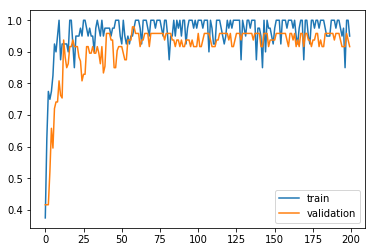

5 0.9267708525061608


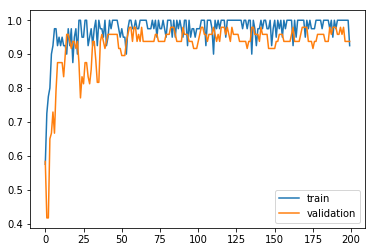

5 0.8091666877269745


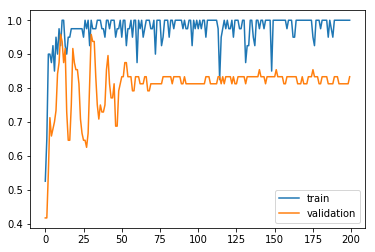

5 0.8246041882038116


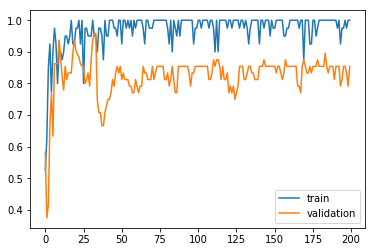

5 0.9247088076606873


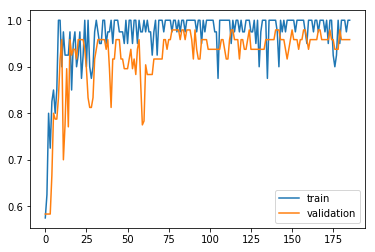

In [0]:
for th in tme_history:
    print(i, np.mean(th.val_ac_history))
    plt.plot(th.train_ac_history, label='train')
    plt.plot(th.val_ac_history, label='validation')
    plt.legend()
    plt.show()
    plt.pause(.001)
    

In [0]:
top_model = tme_history[0]
if len(tme_history) > 1:
    for tm in tme_history[1:]:
        if np.mean(tm.val_ac_history) > np.mean(top_model.val_ac_history):
            top_model = tm
model = top_model.model
    

rm: cannot remove 'submission.csv': No such file or directory






  0%|          | 0/15 [00:00<?, ?it/s]



  7%|▋         | 1/15 [00:02<00:37,  2.67s/it]



 13%|█▎        | 2/15 [00:03<00:28,  2.18s/it]



 20%|██        | 3/15 [00:04<00:21,  1.82s/it]



 27%|██▋       | 4/15 [00:05<00:17,  1.56s/it]



 33%|███▎      | 5/15 [00:06<00:13,  1.39s/it]



 40%|████      | 6/15 [00:07<00:11,  1.26s/it]



 47%|████▋     | 7/15 [00:08<00:09,  1.17s/it]



 53%|█████▎    | 8/15 [00:09<00:07,  1.12s/it]



 60%|██████    | 9/15 [00:10<00:06,  1.08s/it]



 67%|██████▋   | 10/15 [00:11<00:05,  1.04s/it]



 73%|███████▎  | 11/15 [00:12<00:04,  1.02s/it]



 80%|████████  | 12/15 [00:13<00:03,  1.01s/it]



 87%|████████▋ | 13/15 [00:14<00:01,  1.01it/s]



 93%|█████████▎| 14/15 [00:15<00:00,  1.02it/s]



100%|██████████| 15/15 [00:16<00:00,  1.05it/s]





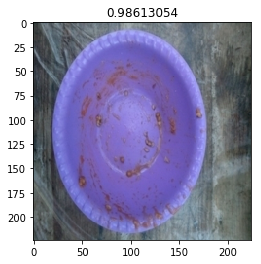

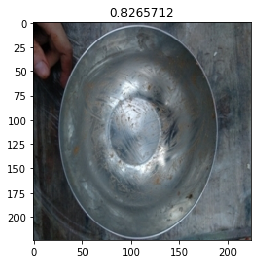

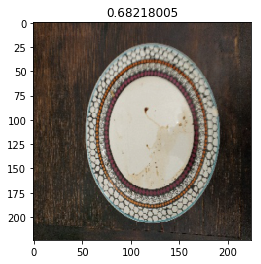

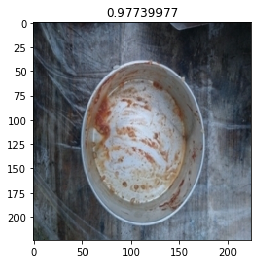

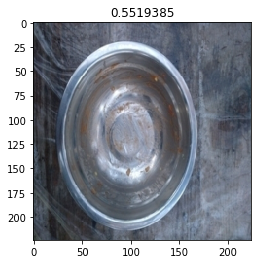

...

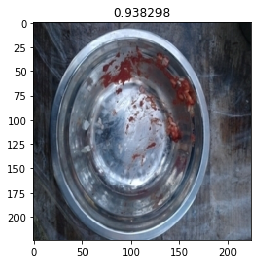

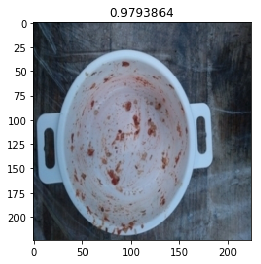

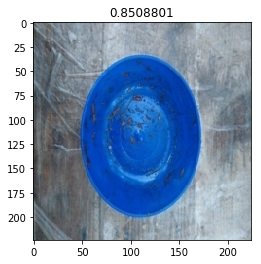

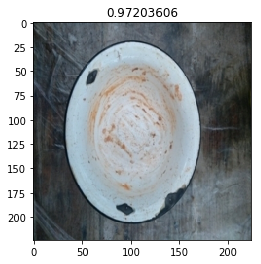

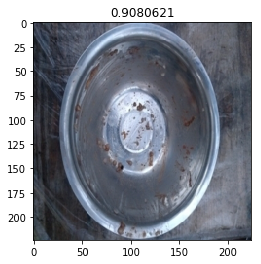

In [0]:
#%%

!rm -rf test
!rm submission.csv

test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths(test_dir, val_transforms)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=50, shuffle=False, num_workers=batch_size)

model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)
    
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

submission_df.to_csv('submission.csv')

In [0]:
!ls -la

total 48
drwxr-xr-x 1 root root 4096 Jul 28 21:47 .
drwxr-xr-x 1 root root 4096 Jul 28 20:18 ..
drwxr-xr-x 1 root root 4096 Jul 19 16:14 .config
drwx------ 3 root root 4096 Jul 28 20:57 DRIVE
drwxr-xr-x 3 root root 4096 Jul 28 20:57 inputs
drwxr-xr-x 1 root root 4096 Jul 19 16:14 sample_data
-rw-r--r-- 1 root root 8653 Jul 28 21:47 submission.csv
drwxr-xr-x 3 root root 4096 Jul 28 21:47 test
drwxr-xr-x 4 root root 4096 Jul 28 21:01 train
drwxr-xr-x 4 root root 4096 Jul 28 21:01 val
